In [ ]:
# Copyright (c) 2018-present, Borealis AI.
# All rights reserved.
# This source code is licensed under the license found in the
# LICENSE file in the root directory of this source tree.

# Author: Yanshuai Cao

In [1]:
import matplotlib.pyplot as plt
plt.style.use('ggplot')
import numpy as np
import pandas as pd
import os, sys

In [2]:

import theano
import numpy as np

import lasagne
from theano.sandbox.rng_mrg import MRG_RandomStreams
import lasagne.layers as ll
import lasagne.updates as lu
import lasagne.nonlinearities as ln
import os

from utils import registery_factory, batch, ac_term, me_term
 
import theano.tensor as T

from collections import OrderedDict
from utils.gan_utils import critic_output_layer, build_costs


rng = np.random.RandomState(1111)
theano_rng = MRG_RandomStreams(rng.randint(2 ** 15))
lasagne.random.set_rng(np.random.RandomState(rng.randint(2 ** 15)))
import utils
_base_hidden_nf = 16


WARNING (theano.gof.cmodule): The same cache key is associated to different modules (/home/ycao/.theano/compiledir_Linux-4.4--generic-x86_64-with-debian-stretch-sid-x86_64-2.7.14-64/tmplGk4M1 and /home/ycao/.theano/compiledir_Linux-4.4--generic-x86_64-with-debian-stretch-sid-x86_64-2.7.14-64/tmpxbeT6R). This is not supposed to happen! You may need to manually delete your cache directory to fix this.
Using cuDNN version 7005 on context None
Mapped name None to device cuda: GeForce GTX 1080 Ti (0000:0E:00.0)


In [3]:
def gen_mog(n=40000, sigma=.05):
    thetas = np.arange(0, 2*np.pi, np.pi / 2)
    x = np.cos(thetas)
    y = np.sin(thetas)
    centres = np.hstack([x[:,None],y[:,None]])
    centres[0,:] += (centres[1,:]-centres[0,:])/2
    
    c_inds = np.random.choice(len(centres), n, replace=True)
    zs = np.random.randn(n,centres.shape[1])
    dat = centres[c_inds] + zs * sigma
    dat -= dat.mean(axis=0)
    dat /= dat.std(axis=0)
    return dat/2.

In [4]:
X=gen_mog()

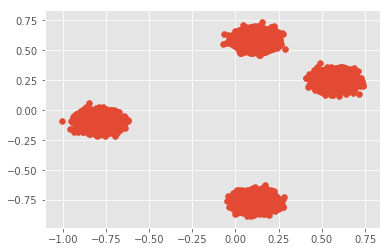

In [5]:
plt.scatter(X[:,0], X[:,1])
plt.show()

In [6]:
def build_g(batch_size, z_dim=10, 
            g_nl=ln.rectify,                 
            g_dp=None, 
            noise_seed=1111, **kwargs):

    g_bn = lambda x: x #utils.batch_norm(x, steal_nl=1, axes='bn')
    h_dim = 10
    
    g_layers = OrderedDict([])
    g_register = registery_factory(g_layers)

    rng = np.random.RandomState(noise_seed)
    theano_rng = MRG_RandomStreams(rng.randint(2 ** 15))
    
    noise = theano_rng.normal(size=(batch_size, z_dim))

    l_z = g_register(ll.InputLayer(shape=(batch_size, z_dim), input_var=noise), 'l_z')
    l_h = g_register(ll.DenseLayer(l_z, num_units=h_dim, nonlinearity=g_nl))
    l_h = g_register(ll.DenseLayer(g_bn(l_h), num_units=h_dim, nonlinearity=g_nl))
    l_h = g_register(ll.DenseLayer(g_bn(l_h), num_units=h_dim, nonlinearity=g_nl))
    l_out_g = g_register(ll.DenseLayer(g_bn(l_h), num_units=2, nonlinearity=ln.tanh))
     
    return l_out_g, g_layers

DD = 10
def build_mlp_d(batch_size, gan_mode=None,
                d_nl=ln.LeakyRectify(.2),
                noise_seed=1111,
                **kwargs):
    
    #d_bn = lambda x: x #utils.batch_norm(x, steal_nl=1, axes='bn')
    dim = DD
    
    nl_layer = ll.NonlinearityLayer
    mlp = ll.DenseLayer
    d_layers = OrderedDict([])
    d_register = registery_factory(d_layers)

    l_data = ll.InputLayer(shape=(None, 2))
    ####STOPPED here

    l_h = d_register(ll.FlattenLayer(l_data))    
    l_h = d_register(mlp(l_h, num_units=dim, nonlinearity=None),'h1')
    l_h = nl_layer(l_h, d_nl)
    l_h = d_register(mlp(l_h, num_units=dim, nonlinearity=None),'h2')
    l_h = nl_layer(l_h, d_nl)
    l_h = d_register(mlp(l_h, num_units=dim, nonlinearity=None),'h3')
    l_h = nl_layer(l_h, d_nl)
    l_h = d_register(mlp(l_h, num_units=dim, nonlinearity=None),'h4')
    l_out_d = critic_output_layer(l_h, gan_mode, register_func=d_register)

   
    return l_out_d, l_data, d_layers



In [7]:
def gan(batch_size, gan_mode):
        
          
    l_out_g, g_layers         = build_g(batch_size, z_dim=10, 
                                        g_nl=ln.rectify,                 
                                        g_dp=None, 
                                        noise_seed=1111)

    l_out_d, l_data, d_layers = build_mlp_d(batch_size, gan_mode=gan_mode,
                                            d_nl=ln.LeakyRectify(.2),
                                            noise_seed=1111,)
                                            

    return l_out_g, l_out_d, l_data, g_layers, d_layers


In [8]:
batch_size = 64

In [9]:
l_out_g, l_out_d, l_data, g_layers, d_layers = gan(batch_size, 'js-gan')

In [10]:
fake_dat = ll.get_output(l_out_g, deterministic=False)

In [11]:
rng_data = np.random.RandomState()
rng = np.random.RandomState()
theano_rng = MRG_RandomStreams(rng.randint(2 ** 15))
lasagne.random.set_rng(np.random.RandomState(rng.randint(2 ** 15)))



In [12]:
real_dat = T.fmatrix()
fake_dat_cz = T.fmatrix()
    
alpha = theano_rng.uniform((batch_size,1), low = 0.0, high = 1.0)
differences = real_dat - fake_dat
interp_dat = real_dat + (alpha*differences)

In [13]:
preact_layers = [d_layers[d] for d in d_layers.keys() if d.startswith('h')]

In [14]:
interp_evaled = ll.get_output([l_out_d]+preact_layers, interp_dat, deterministic=False)
fake_evaled = ll.get_output([l_out_d]+preact_layers, fake_dat, deterministic=False)
fake_cz_evaled = ll.get_output([l_out_d]+preact_layers, fake_dat_cz, deterministic=False)
real_evaled = ll.get_output([l_out_d]+preact_layers, real_dat, deterministic=False)

In [15]:
mode='all_abs_auto'
weight = 1.
reg_l = [1,2,3]

ae_reg_fake,_ = ac_term([fake_evaled[rl+1] for rl in reg_l ], s=3)
ae_reg_interp,_ = ac_term([interp_evaled[rl+1] for rl in reg_l],s=3)
act_marginal_fake, _ = me_term([fake_evaled[rl+1] for rl in reg_l])
act_marginal_interp, _ = me_term([interp_evaled[rl+1] for rl in reg_l])


output_gen = fake_evaled[0]
output_data = real_evaled[0]

d_cost, g_cost = build_costs(output_gen, output_data, None, None, 'js-gan')

d_cost += (ae_reg_fake + ae_reg_interp + act_marginal_fake + act_marginal_interp) * weight

In [16]:
d_trainable_params = ll.get_all_params(ll.get_all_layers(d_layers.values()), trainable=True)
g_trainable_params = ll.get_all_params(ll.get_all_layers(g_layers.values()), trainable=True)

In [17]:
lr = .001
d_updater = lu.adam(d_cost, d_trainable_params, lr, beta1=.5, beta2=.999)
g_updater = lu.adam(g_cost, g_trainable_params, lr, beta1=.5, beta2=.999)

In [18]:
g_train_func = theano.function(inputs=[], outputs=[g_cost], updates=g_updater)
g_sample_func = theano.function(inputs=[], outputs=fake_dat)                             
d_train_func = theano.function(inputs=[real_dat], outputs=[d_cost, ae_reg_fake, ae_reg_interp, act_marginal_fake, act_marginal_interp], updates=d_updater)

d_monitor_func = theano.function(inputs=[fake_dat_cz], outputs=fake_cz_evaled)


In [19]:
def val2c(h,dim=DD):
    base=np.array([2**n for n in range(dim)])[None,:]
    cc=(base * (np.sign(h)+1)/2.).sum(axis=1)
    return cc

def rescale(v, minx, maxx):
    return ((v-minx) / (maxx-minx))

import numpy as np


def get_colors(num_colors):
    from matplotlib.colors import hsv_to_rgb
    colors = np.ones((num_colors, 3))
    colors[:, 0] = np.arange(0., 1., 1. / num_colors)
    for ii in range(len(colors)):
        colors[ii] = hsv_to_rgb(colors[ii])
    np.random.seed(0)
    np.random.shuffle(colors)
    return colors

def convert_color(imgval, num_color):
    return get_colors(num_color)[imgval.astype(int)]

#import matplotlib.pyplot as plt

#colors = get_colors(30)

#points = list(range(len(colors)))

# plt.figure()
# for cc, pp in zip(colors, points):
#     plt.scatter([pp, ], [pp, ], c=cc)

# plt.show()

In [20]:
lim = 1.5
xx,yy=np.meshgrid(np.linspace(-lim,lim,100),np.linspace(-lim,lim,100))
grid_data = np.hstack([xx.flatten()[:,None], yy.flatten()[:,None]])

2.56590747833 0.0181261785328 0.01080618985 0.718598842621 0.418325603008
[array(0.64067507, dtype=float32)]


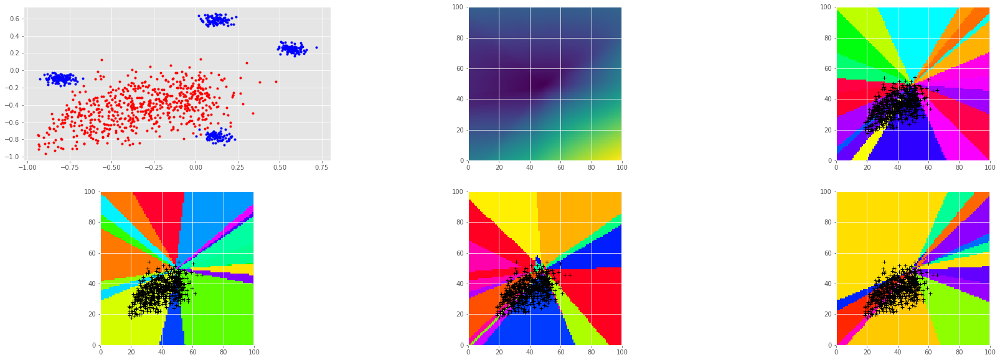

1.31440222263 0.00756232347339 0.00570147624239 0.0194970667362 0.0260133594275
[array(0.80434746, dtype=float32)]


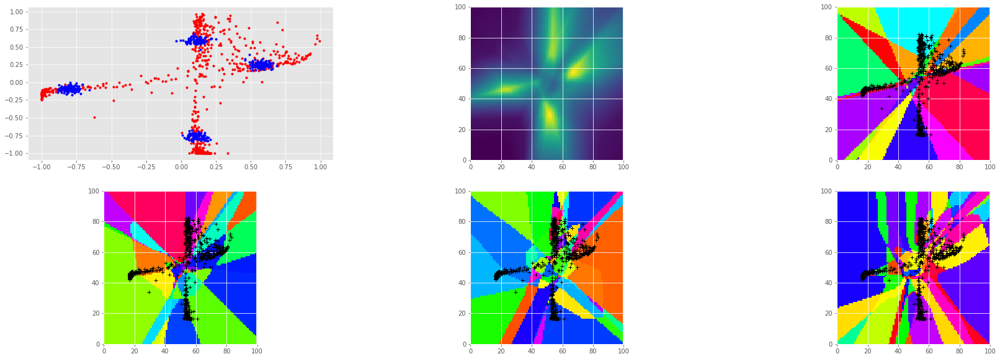

1.39614725113 0.0086971251294 0.00454059010372 0.0930834561586 0.0389938391745
[array(1.1055417, dtype=float32)]


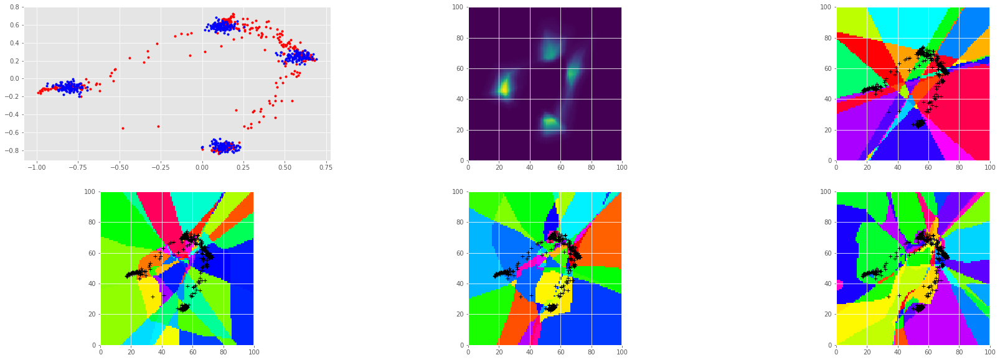

1.40028703213 0.00787799898535 0.00417816080153 0.0297326892614 0.0341903232038
[array(0.8238825, dtype=float32)]


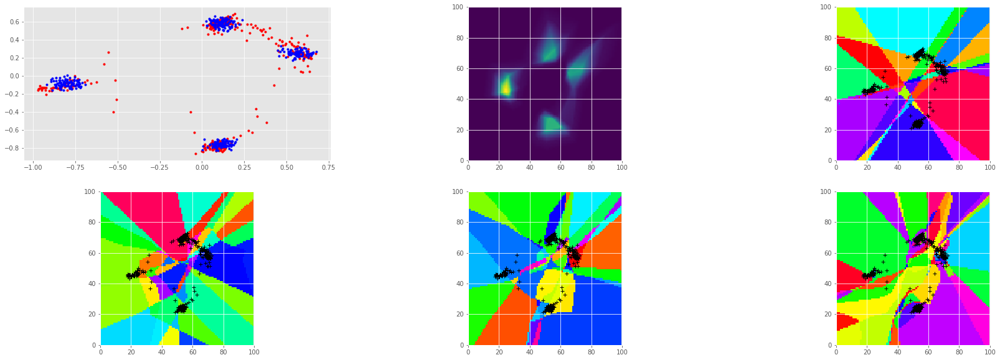

1.44248652458 0.00766986142844 0.00573117332533 0.0532143414021 0.0323490276933
[array(0.87175727, dtype=float32)]


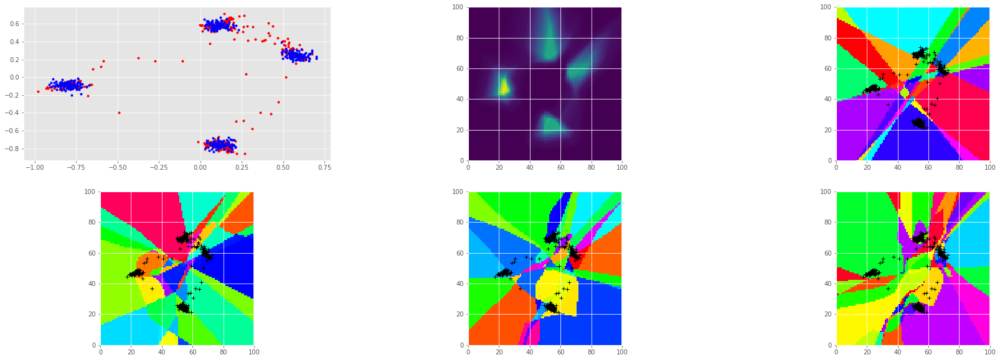

1.55365252495 0.00831242837012 0.00579779408872 0.0493918284774 0.0660645365715
[array(0.72028506, dtype=float32)]


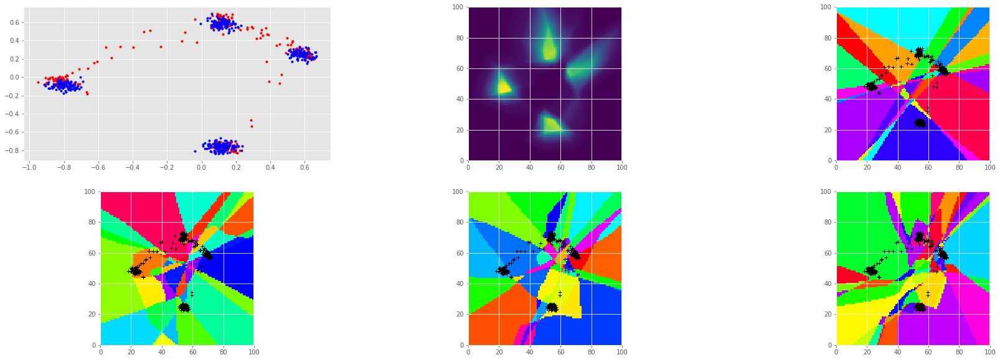

1.43251180649 0.00758993811905 0.00476740673184 0.027774810791 0.0245013013482
[array(0.871747, dtype=float32)]


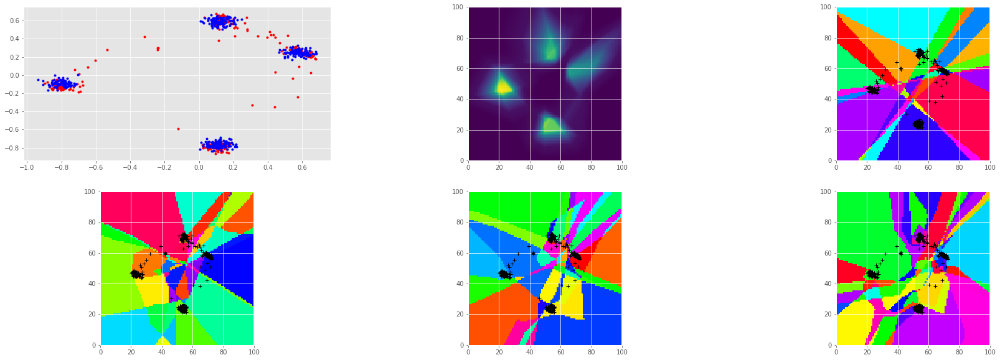

1.36588716507 0.00725593604147 0.00402212236077 0.0331220179796 0.0210693925619
[array(0.7127144, dtype=float32)]


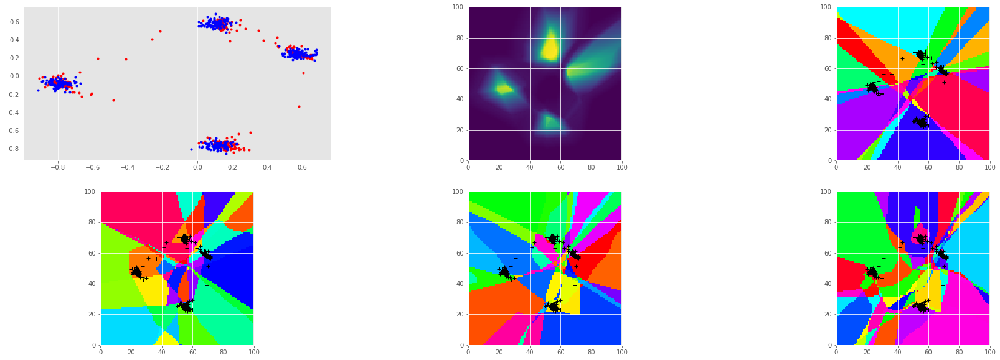

1.42691242695 0.0122341746464 0.00443157367408 0.0191136598587 0.00607236847281
[array(0.8488345, dtype=float32)]


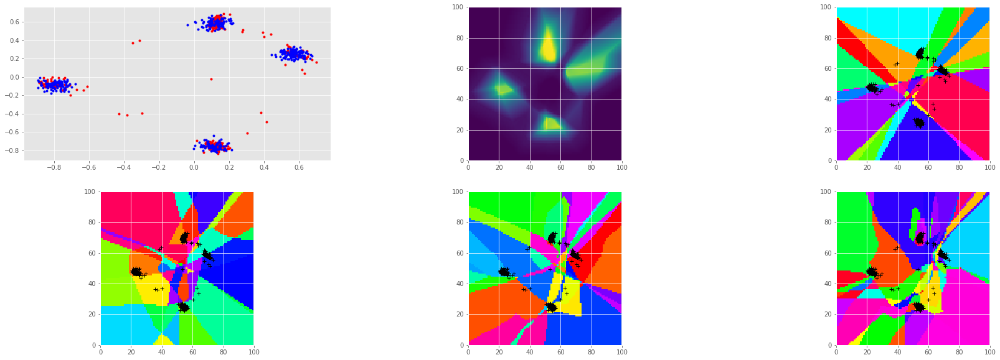

1.45257937908 0.00983487069607 0.00419071223587 0.0424257442355 0.0168162584305
[array(0.8048371, dtype=float32)]


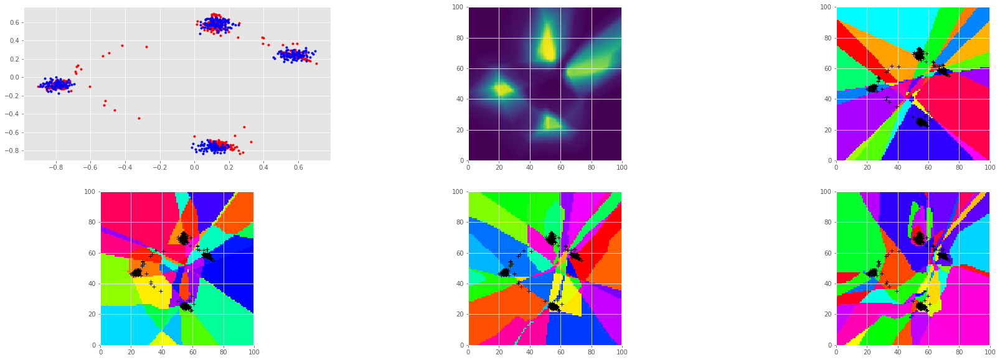

1.44889652729 0.012216209434 0.00349048292264 0.0295232832432 0.0230544116348
[array(0.7171018, dtype=float32)]


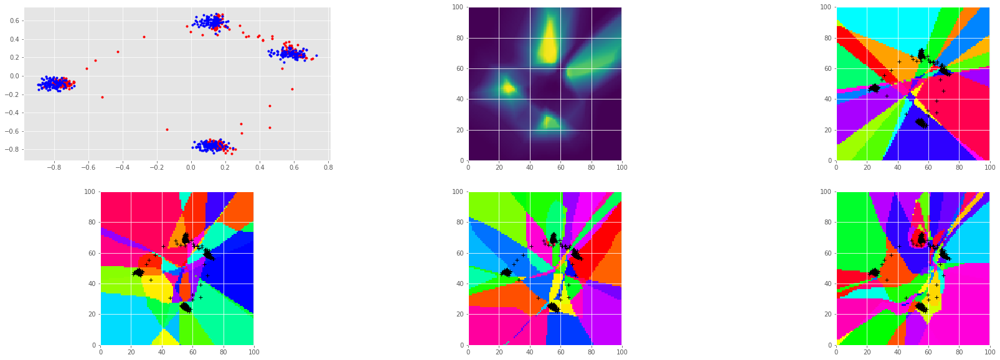

1.45122694969 0.00801683031023 0.00487699732184 0.0124934650958 0.0188326444477
[array(0.7537438, dtype=float32)]


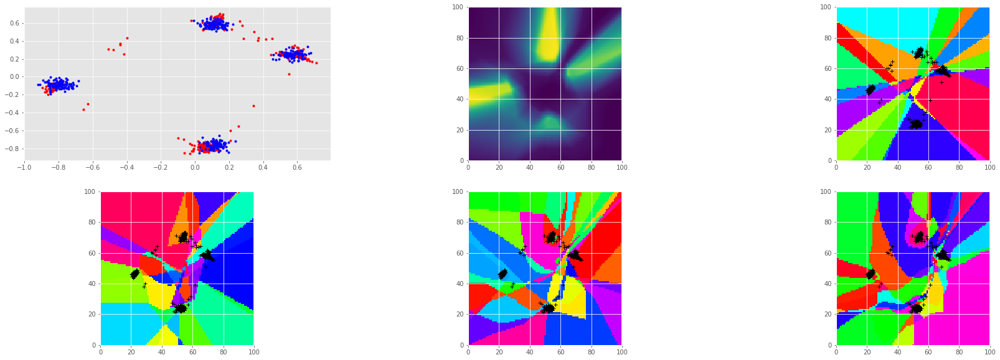

1.4431926012 0.0125940181315 0.00304400874302 0.0726088732481 0.0297848433256
[array(0.8658086, dtype=float32)]


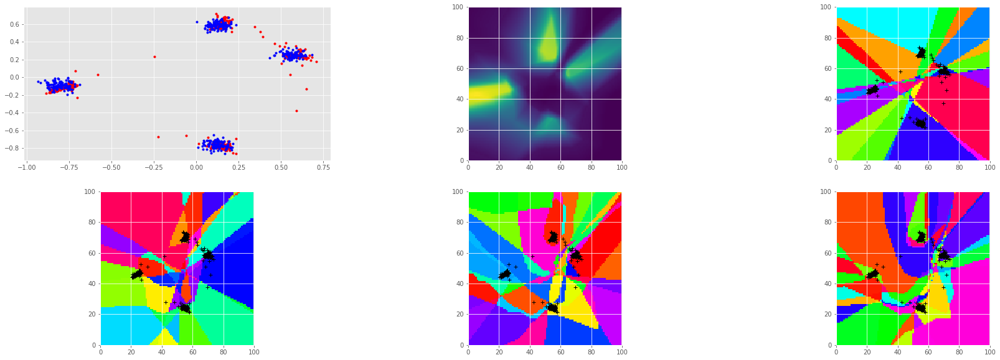

1.42917907238 0.0120485527441 0.00383557821624 0.0378539413214 0.0122342249379
[array(0.6567147, dtype=float32)]


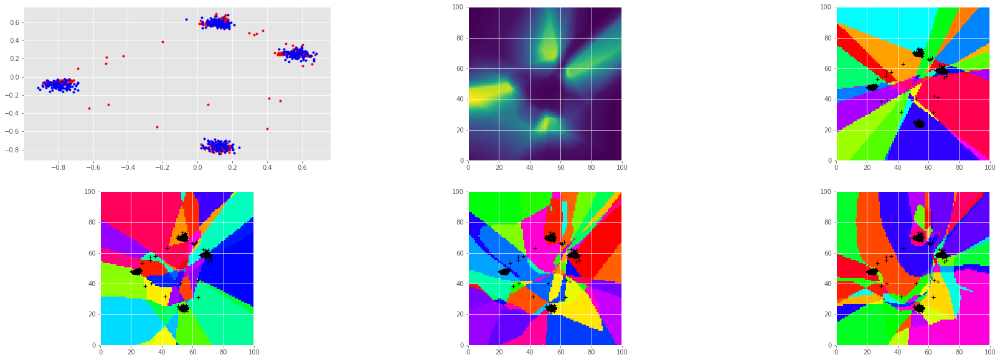

1.4419490099 0.0116539001465 0.00384037243202 0.0741373151541 0.00827495381236
[array(0.79061365, dtype=float32)]


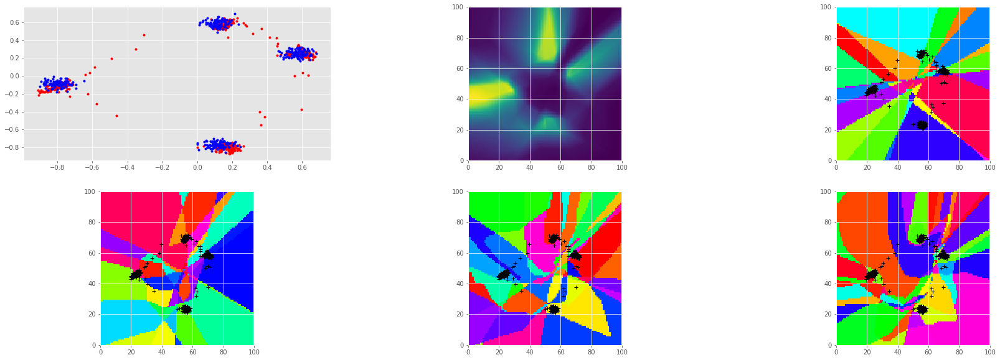

1.4074640274 0.00761032477021 0.00523346941918 0.0134595092386 0.0119552128017
[array(0.6947067, dtype=float32)]


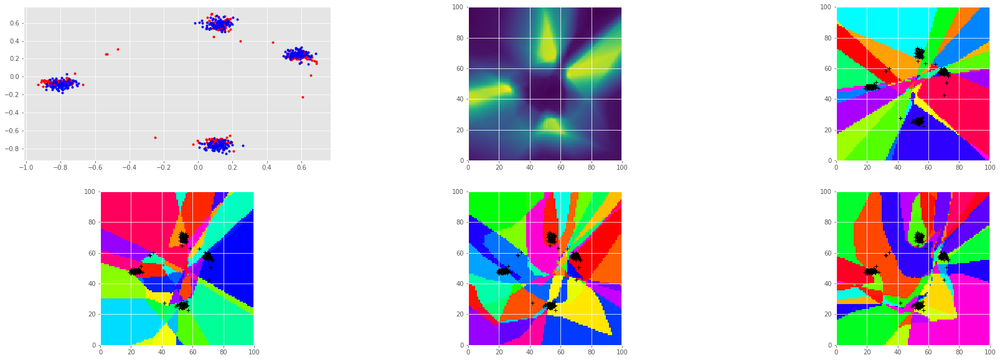

1.46923625469 0.00854169856757 0.00318256160244 0.0414439886808 0.0349187552929
[array(0.72659236, dtype=float32)]


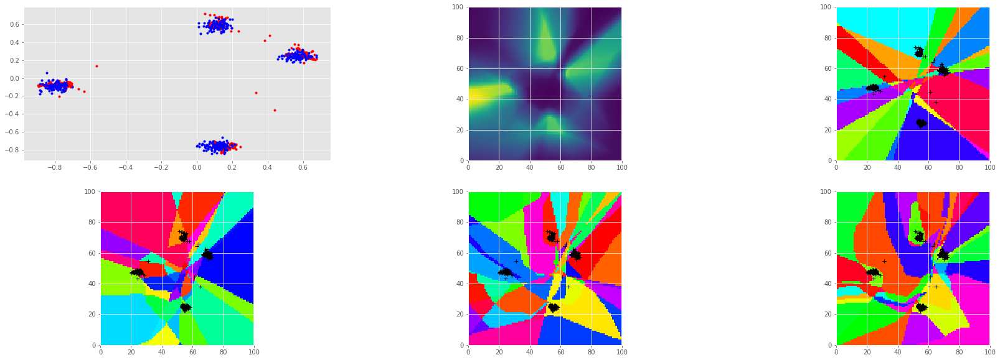

1.4561830759 0.0138648301363 0.0038678906858 0.017660278827 0.0221363119781
[array(0.78634226, dtype=float32)]


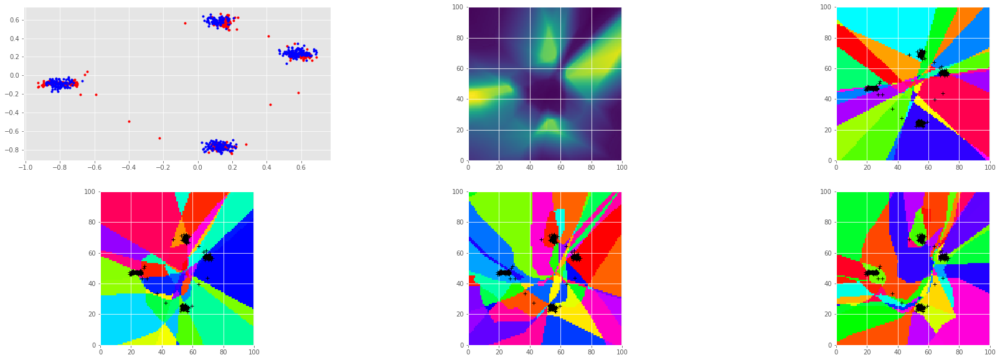

1.40909254551 0.00848971586674 0.00375407817774 0.0117858108133 0.00828860513866
[array(0.7299863, dtype=float32)]


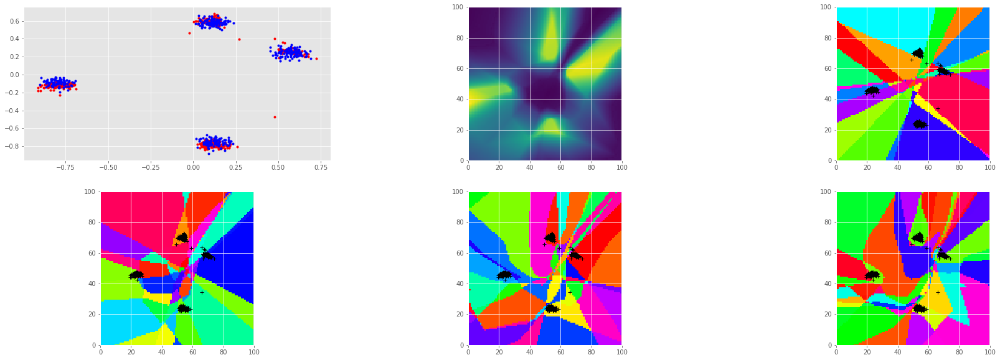

1.40897524357 0.0127060264349 0.00351360207424 0.0151466783136 0.00283071724698
[array(0.6999038, dtype=float32)]


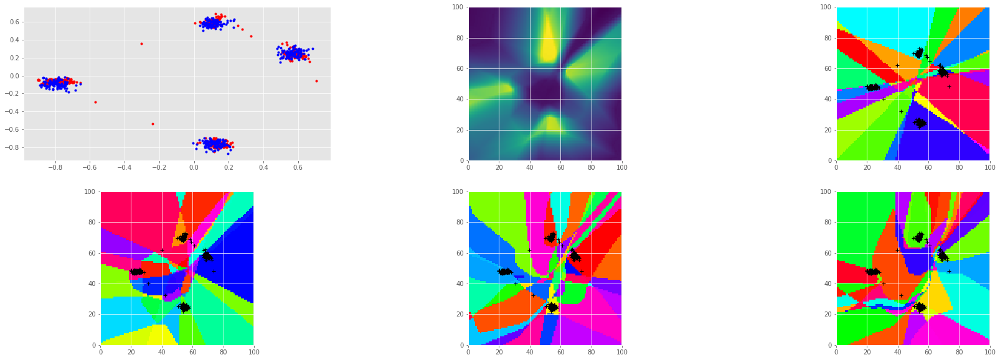

1.41875243187 0.0102491024882 0.00358052924275 0.00410681962967 0.0134580526501
[array(0.72782564, dtype=float32)]


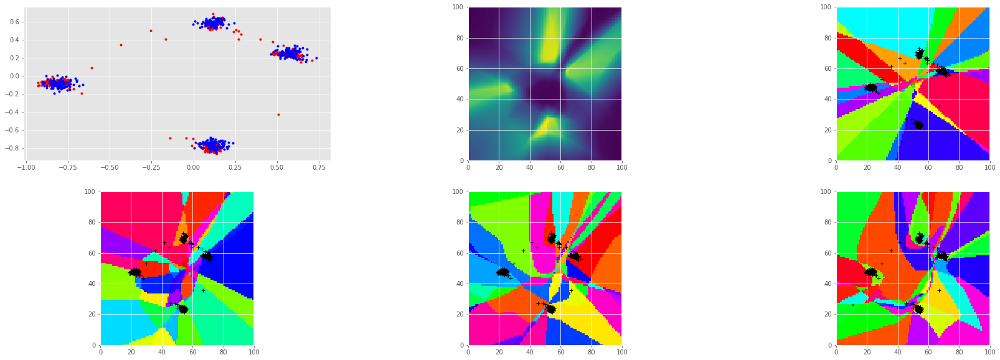

1.42471468449 0.0100129954517 0.00323163229041 0.0117230294272 0.0126008605585
[array(0.70142496, dtype=float32)]


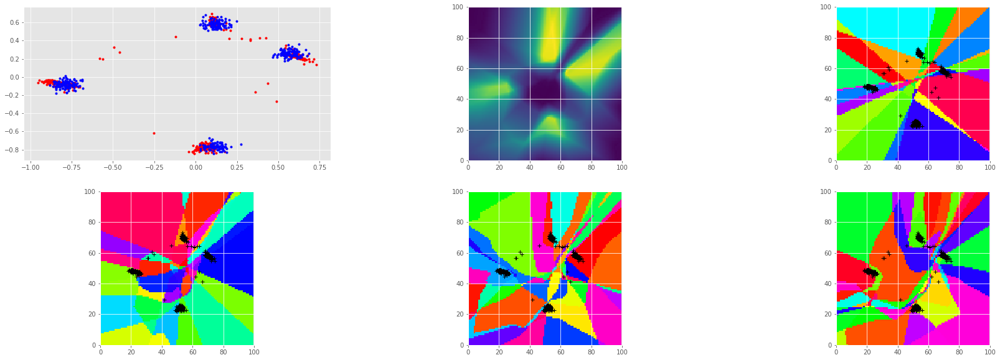

1.43668556213 0.0087207313627 0.0042466185987 0.00432950817049 0.0382513254881
[array(0.6934749, dtype=float32)]


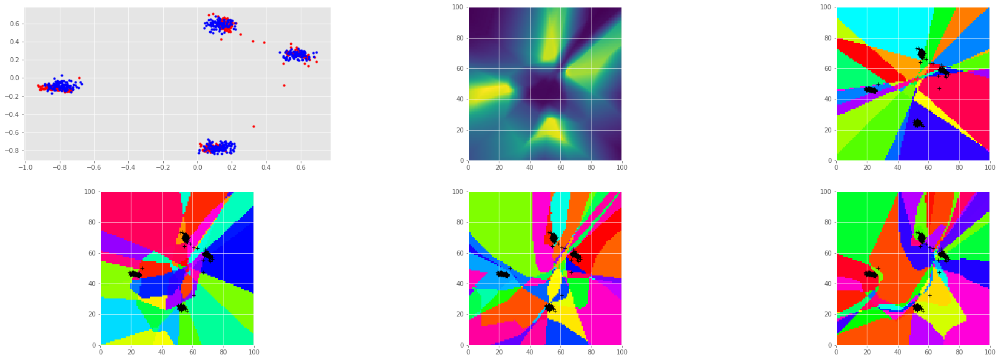

1.40584814548 0.00957851670682 0.00415000878274 0.0285025015473 0.0119376732036
[array(0.67863834, dtype=float32)]


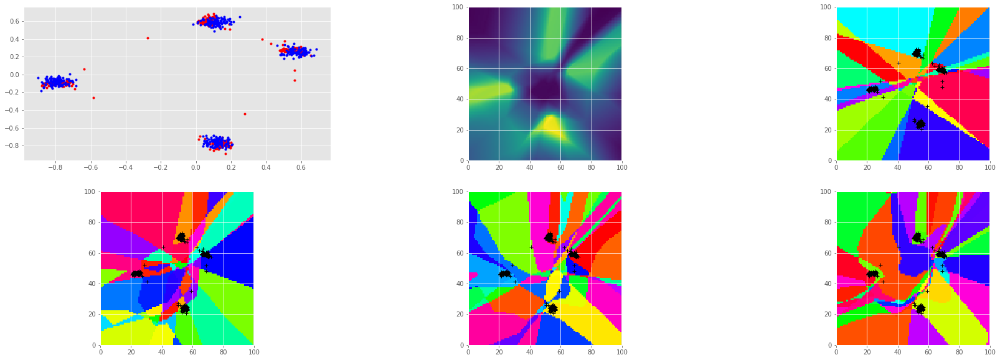

1.43855726719 0.0107505246997 0.00306855654344 0.0293191112578 0.00944197177887
[array(0.7007027, dtype=float32)]


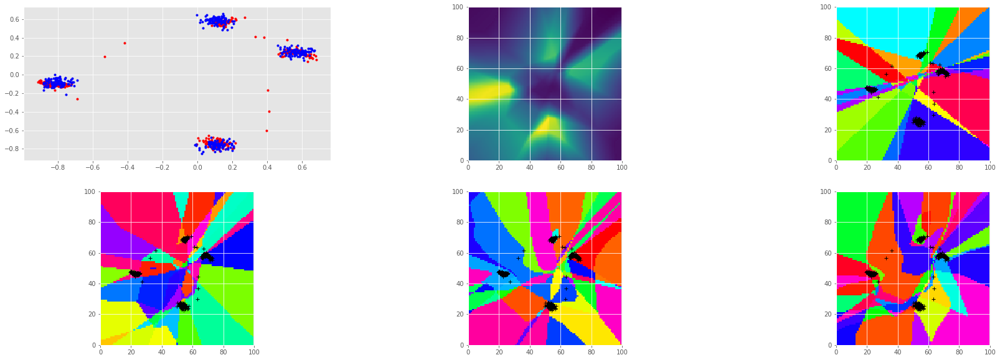

1.41079449654 0.0105996616185 0.00310091581196 0.0120169688016 0.0123221836984
[array(0.69305974, dtype=float32)]


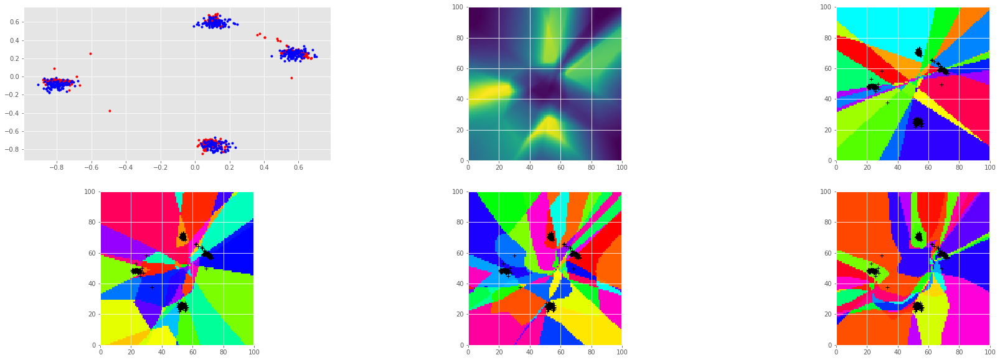

1.44098412991 0.0102147087455 0.00335022434592 0.0403021536767 0.00634756078944
[array(0.723251, dtype=float32)]


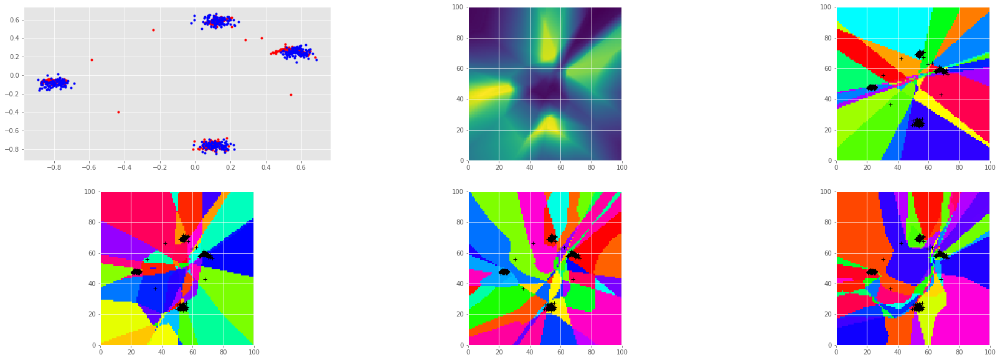

1.44078218937 0.0133994705975 0.00421553663909 0.0156115358695 0.0412286743522
[array(0.6948059, dtype=float32)]


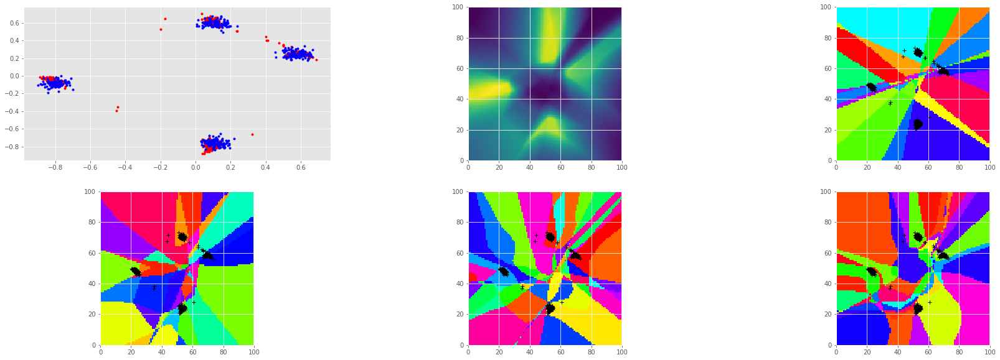

1.4299018383 0.0101202754304 0.00335216056556 0.0253915097564 0.0129697658122
[array(0.6973722, dtype=float32)]


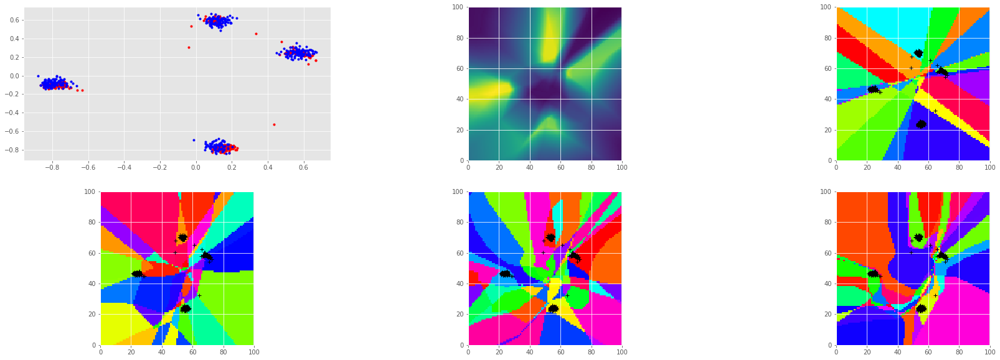

1.45537161827 0.0142649468035 0.00300544640049 0.0691576451063 0.0257777329534
[array(0.7280568, dtype=float32)]


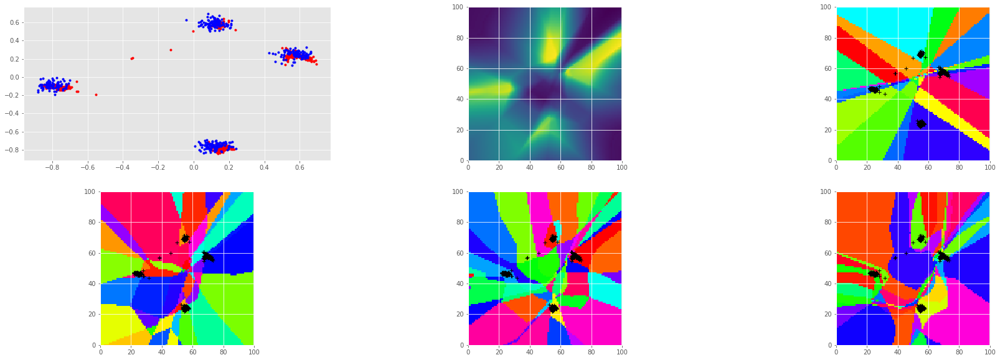

1.50182509422 0.0162400174886 0.00331388530321 0.128235816956 0.0216382034123
[array(0.7114315, dtype=float32)]


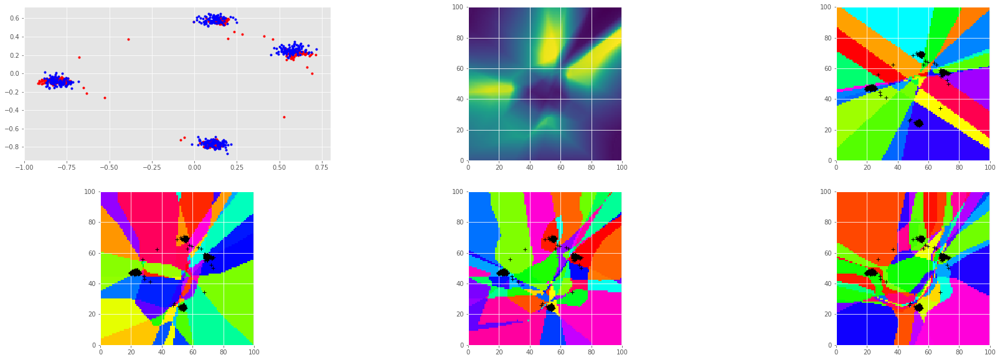

1.41961872578 0.00815440900624 0.00277559924871 0.0142315551639 0.0131457699463
[array(0.70171654, dtype=float32)]


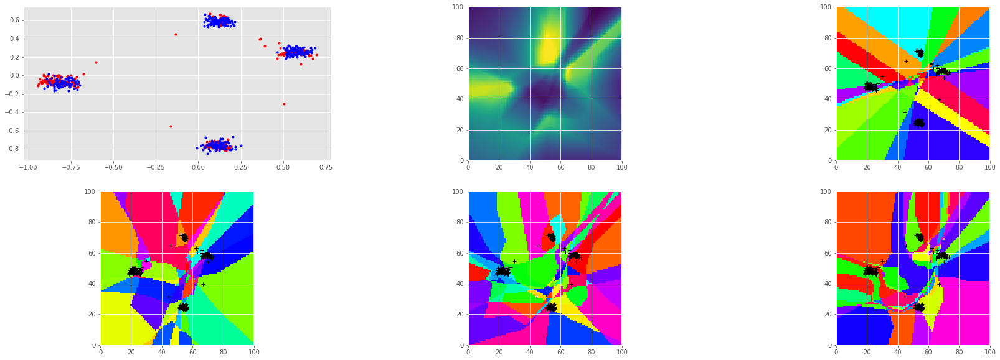

1.44366180897 0.0101603399962 0.00293566193432 0.0230734683573 0.0297313034534
[array(0.6948739, dtype=float32)]


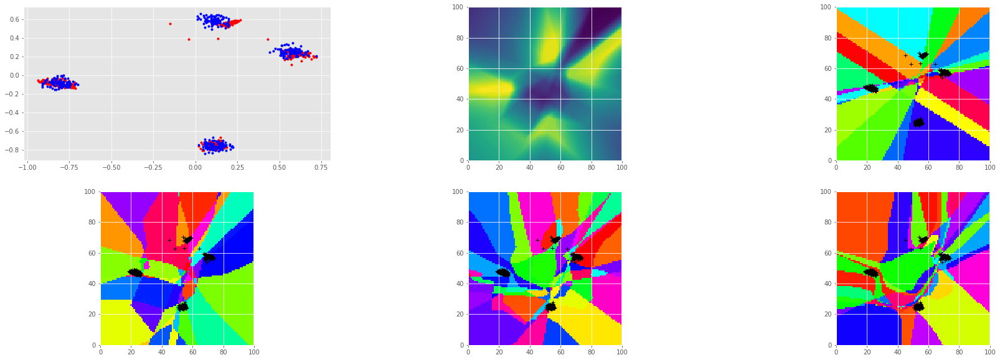

1.43047571182 0.0107333939523 0.00389461265877 0.00653467327356 0.0212569050491
[array(0.70309705, dtype=float32)]


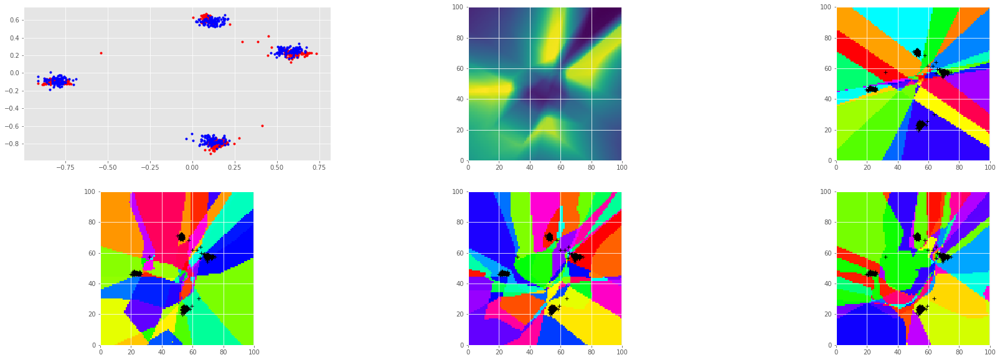

1.46203136444 0.0101951379329 0.00320381112397 0.0483825132251 0.0269067399204
[array(0.69759905, dtype=float32)]


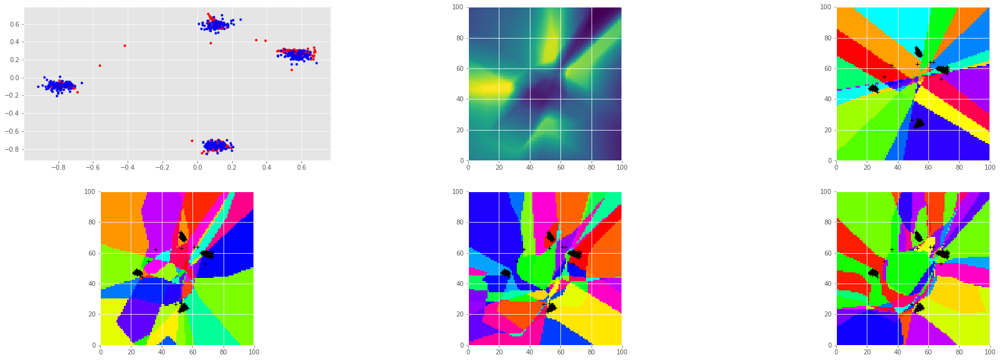

1.41799974442 0.0103500382975 0.00432991608977 0.00534756248817 0.0152426492423
[array(0.69170654, dtype=float32)]


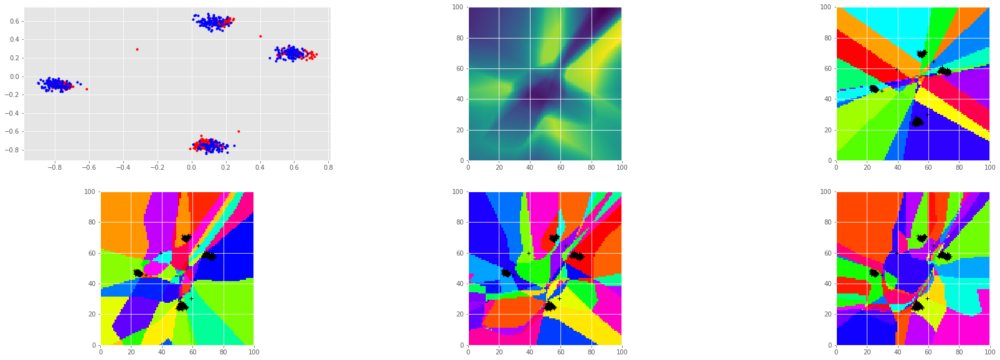

1.45429801941 0.0103552341461 0.00307408161461 0.0338699296117 0.0098590478301
[array(0.6853548, dtype=float32)]


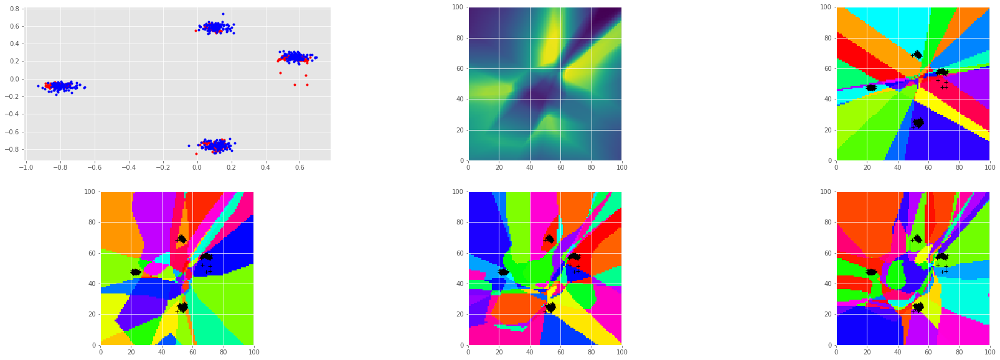

1.44033360481 0.0108853392303 0.00377039657906 0.0328508280218 0.00963038578629
[array(0.6983139, dtype=float32)]


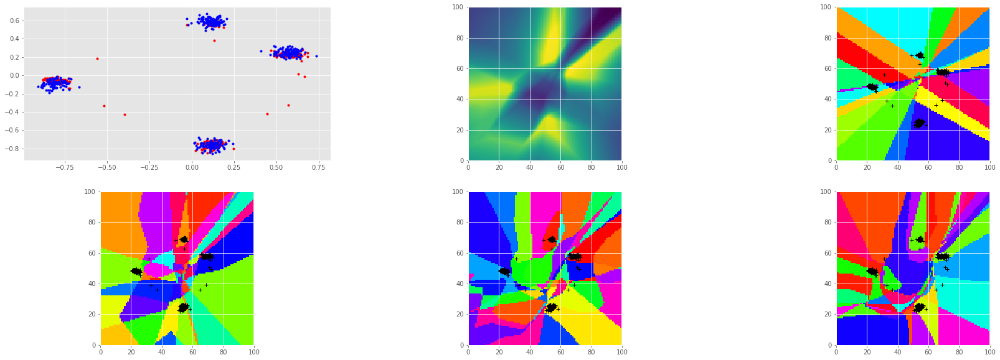

1.45654678345 0.0111335478723 0.00325511023402 0.0131348166615 0.0394006222486
[array(0.6921954, dtype=float32)]


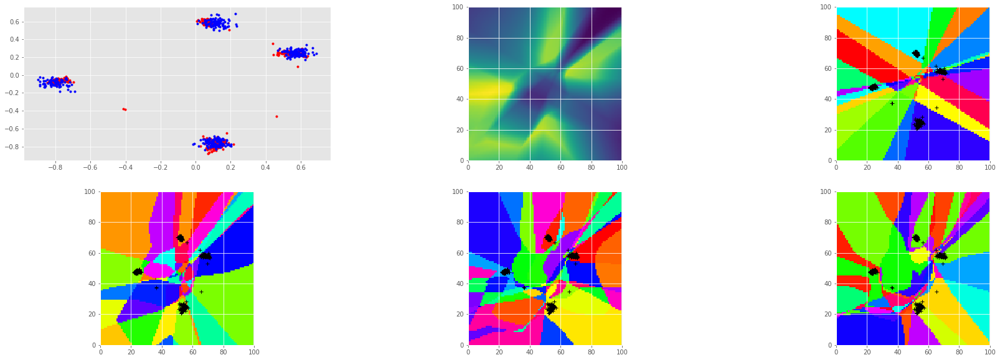

1.43557929993 0.0105753671378 0.00411369465292 0.0340496189892 0.00555140059441
[array(0.7056929, dtype=float32)]


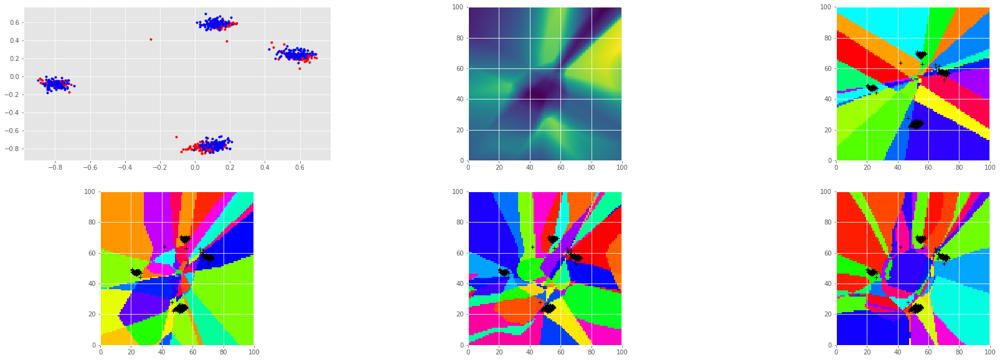

1.42586648464 0.0105122048408 0.00416167732328 0.00977276451886 0.029155164957
[array(0.6927886, dtype=float32)]


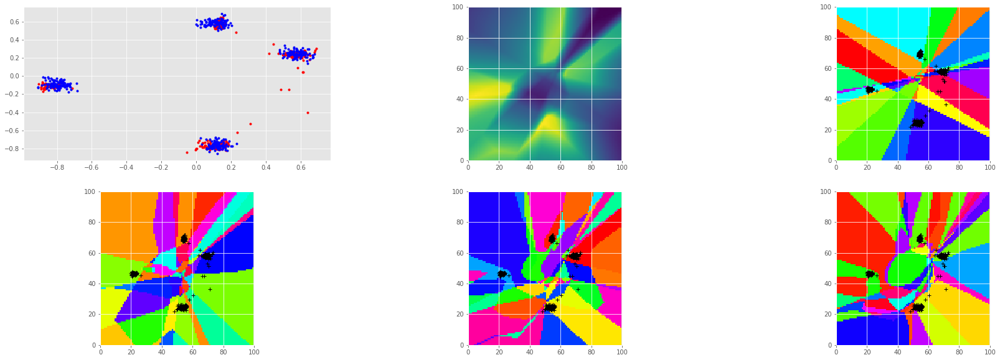

1.44206905365 0.0102181453258 0.00360937137157 0.0144679304212 0.0178492330015
[array(0.7172574, dtype=float32)]


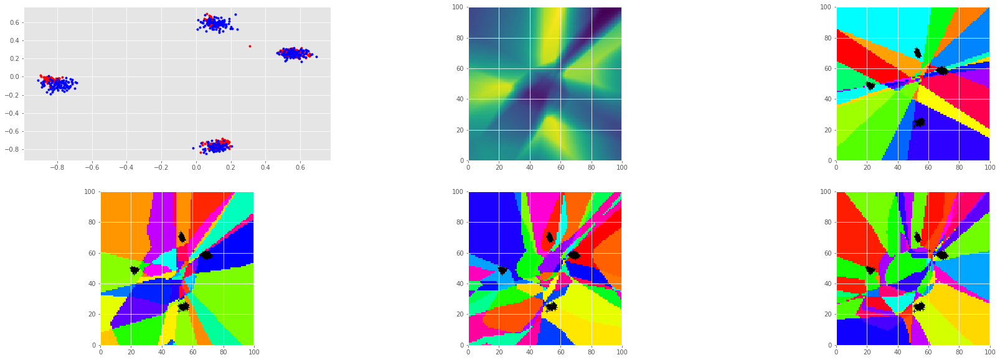

1.44717013836 0.0111394878477 0.00378314545378 0.0198294296861 0.00834439881146
[array(0.69670725, dtype=float32)]


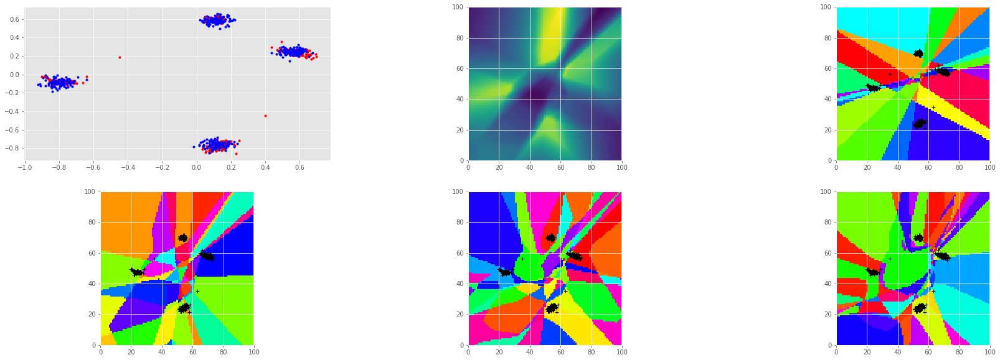

1.42830622196 0.0101468190551 0.00336648197845 0.0250496771187 0.00803129374981
[array(0.71194255, dtype=float32)]


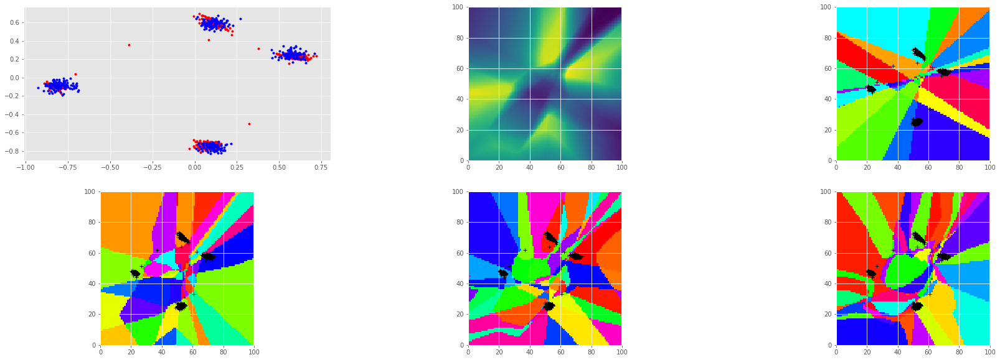

1.42783105373 0.0107097569853 0.00330333039165 0.015915453434 0.00617259554565
[array(0.697884, dtype=float32)]


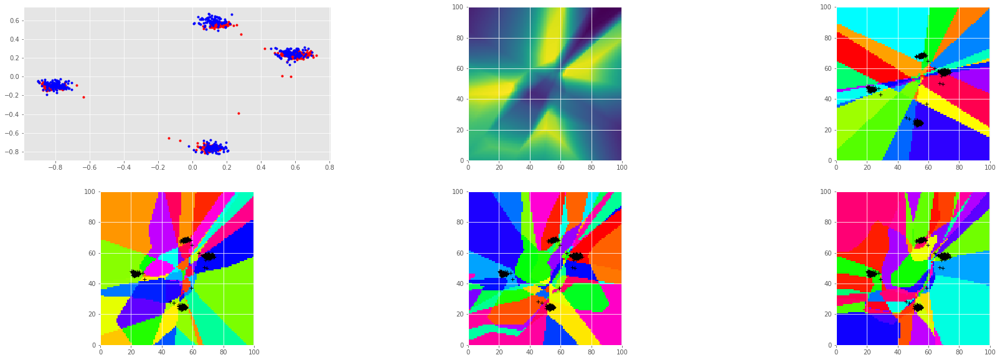

1.43333005905 0.00988692417741 0.00393388792872 0.0182844456285 0.014568163082
[array(0.69204754, dtype=float32)]


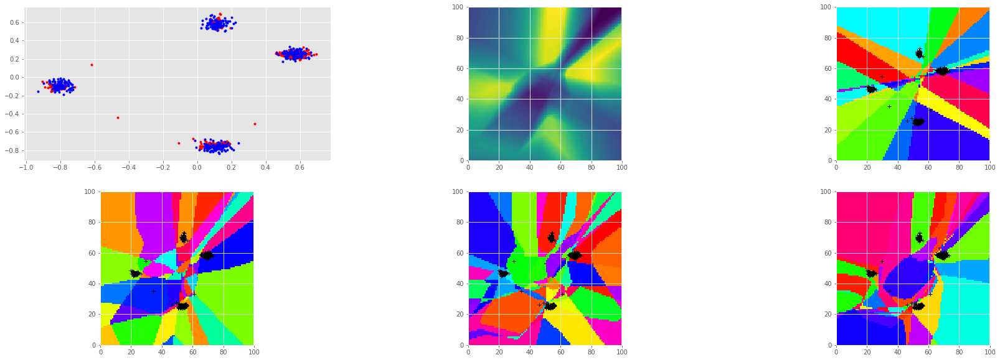

1.42898523808 0.0105385407805 0.00360079016536 0.00871630664915 0.0277071036398
[array(0.7029282, dtype=float32)]


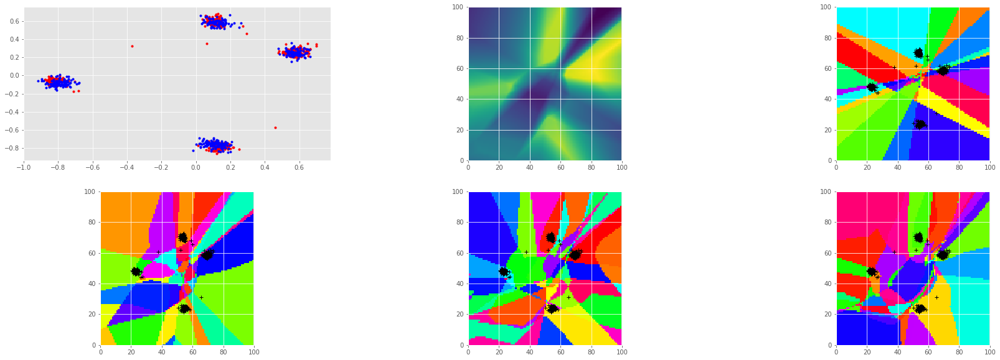

1.44936788082 0.0116615369916 0.00311267445795 0.0271224528551 0.0252377688885
[array(0.69775367, dtype=float32)]


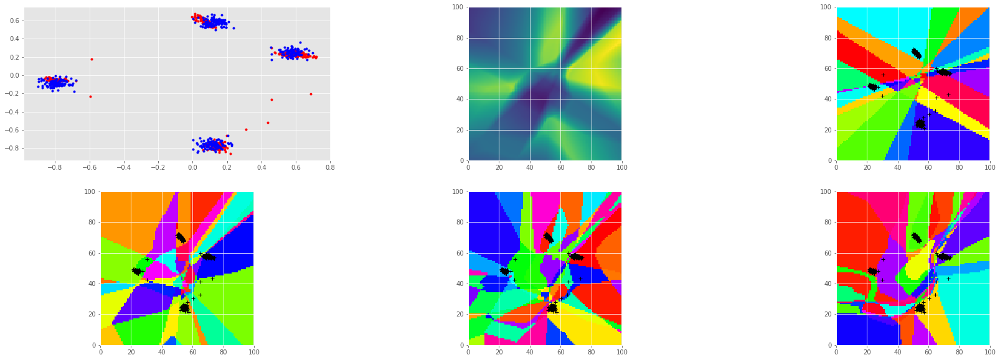

1.4085392952 0.00965578481555 0.00347836827859 0.00125748221762 0.0117286965251
[array(0.6959851, dtype=float32)]


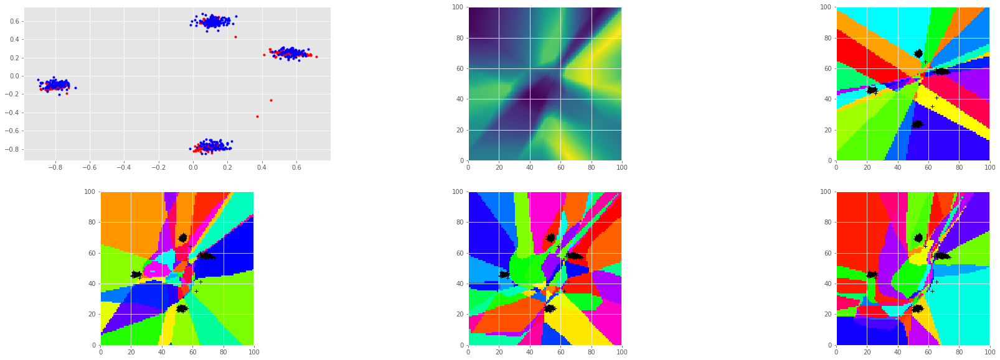

1.45153582096 0.0116798952222 0.00387836992741 0.0313762240112 0.03305914253
[array(0.6908023, dtype=float32)]


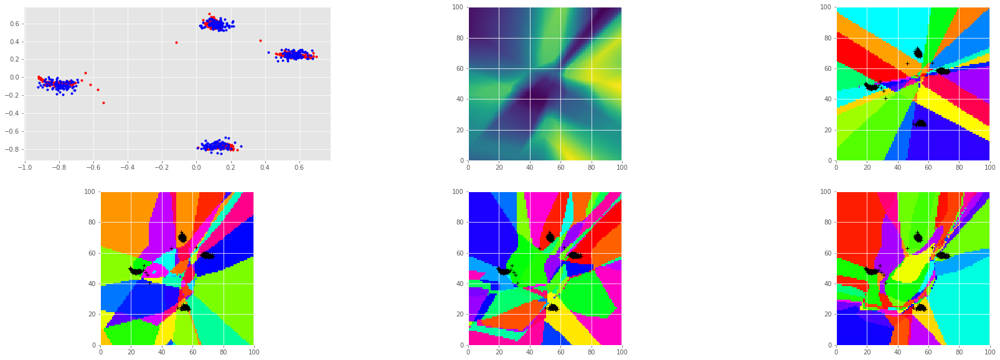

1.43137228489 0.00848320499063 0.00262082926929 0.0321799851954 0.0268056578934
[array(0.69323003, dtype=float32)]


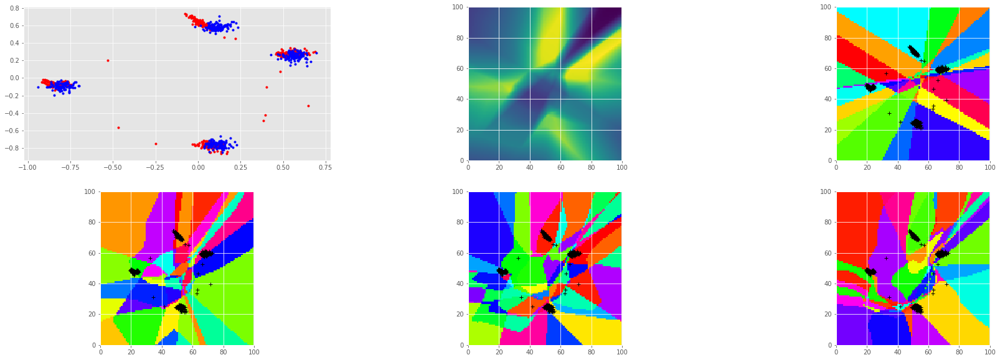

1.42542028427 0.00964457262307 0.00353845581412 0.0271138623357 0.0167770665139
[array(0.71615154, dtype=float32)]


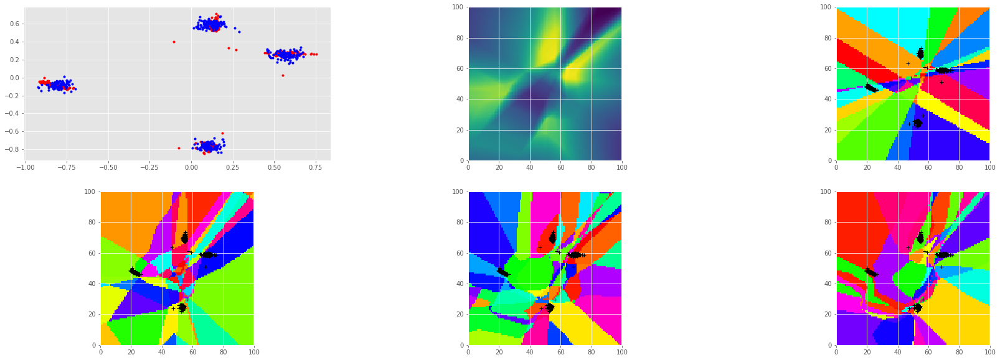

1.42968130112 0.00894853938371 0.00311611173674 0.0295572951436 0.00790485739708
[array(0.7001791, dtype=float32)]


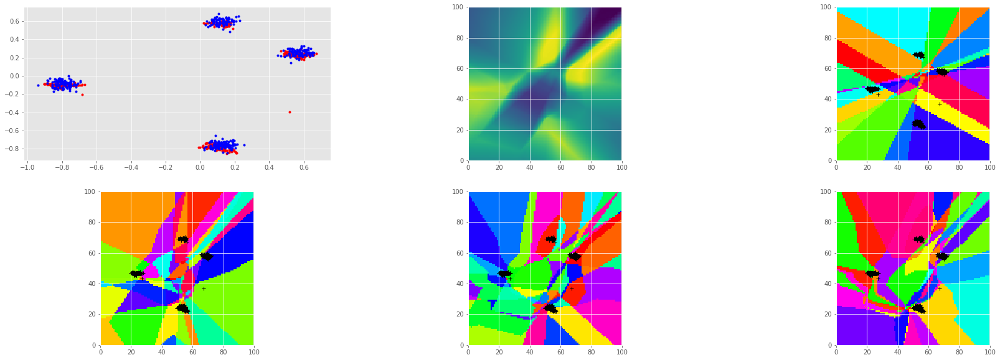

1.43515169621 0.0121247004718 0.00361350155436 0.0272275023162 0.043750308454
[array(0.7136262, dtype=float32)]


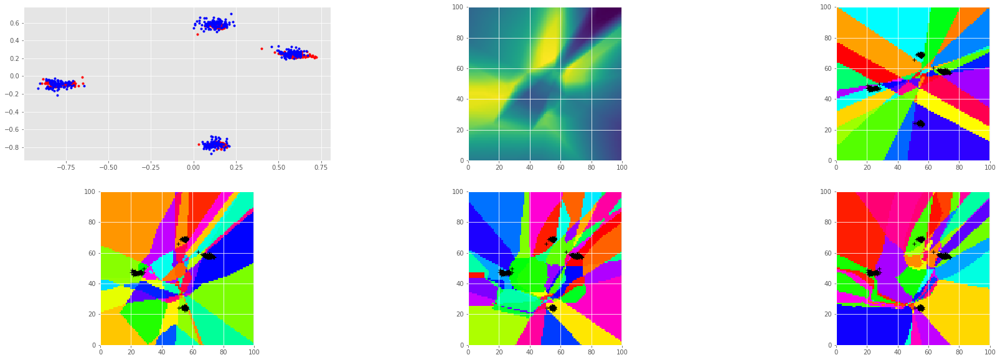

1.43820035458 0.0101755000651 0.00295372353867 0.0299135204405 0.00489459559321
[array(0.7152393, dtype=float32)]


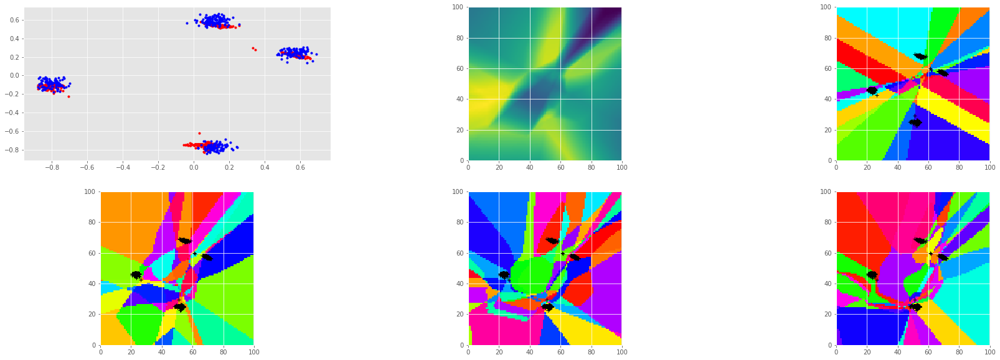

1.42916953564 0.00817975308746 0.00358446501195 0.0204396247864 0.0123262582347
[array(0.6938799, dtype=float32)]


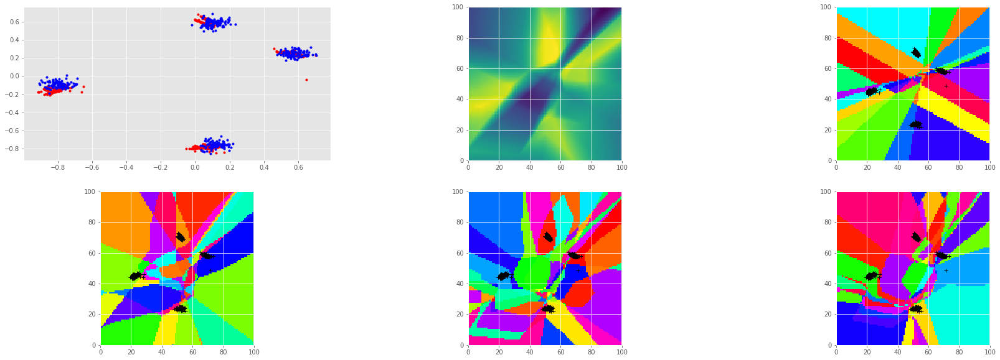

1.3996847868 0.0101325791329 0.00201057223603 0.012641761452 0.00455361139029
[array(0.7025269, dtype=float32)]


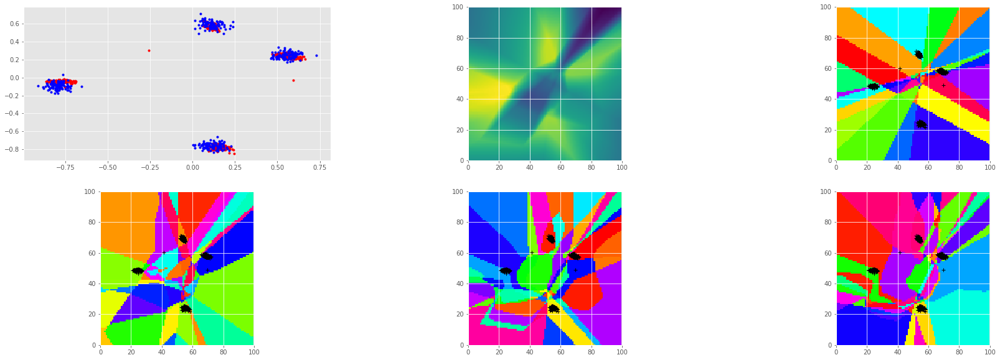

1.46048951149 0.0095736309886 0.00343651883304 0.0419670492411 0.0168075412512
[array(0.703546, dtype=float32)]


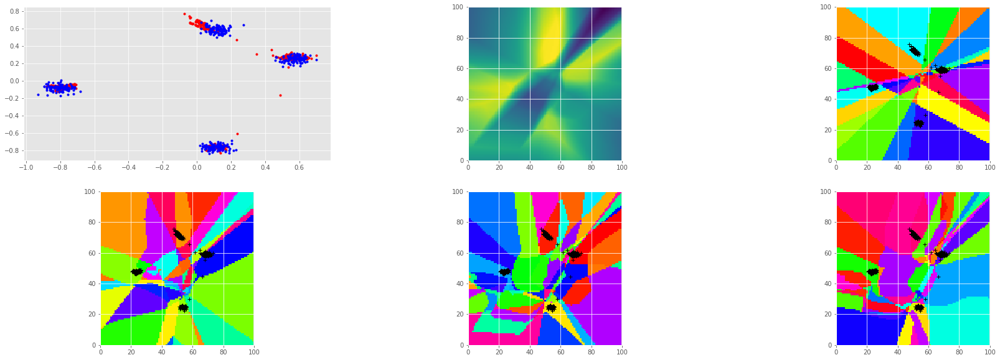

1.45425534248 0.0113385198638 0.00331497797742 0.0513673685491 0.0112508041784
[array(0.68753755, dtype=float32)]


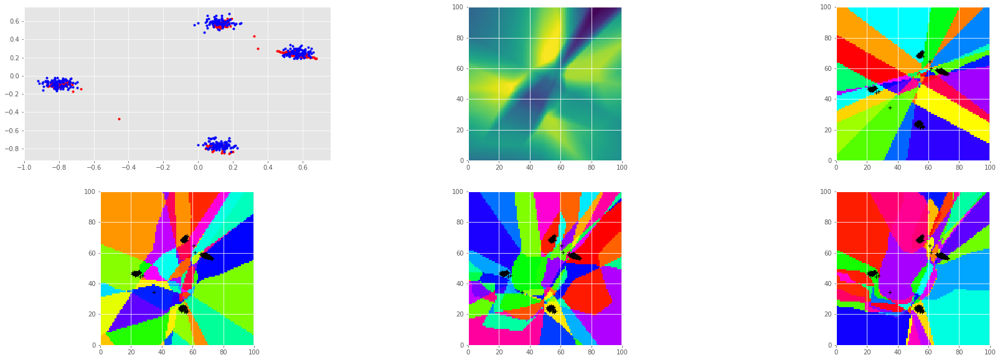

1.45661699772 0.0104535706341 0.00241004489362 0.053623251617 0.0124757122248
[array(0.6946547, dtype=float32)]


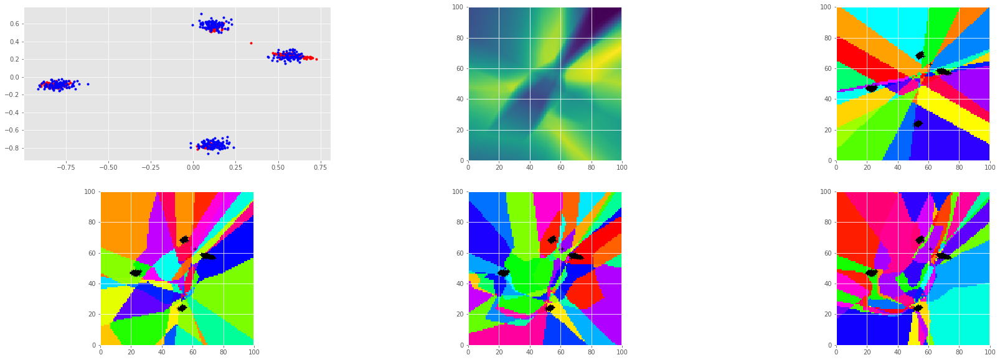

1.42390322685 0.00869431346655 0.00324081187136 0.00274326722138 0.0233763568103
[array(0.6937542, dtype=float32)]


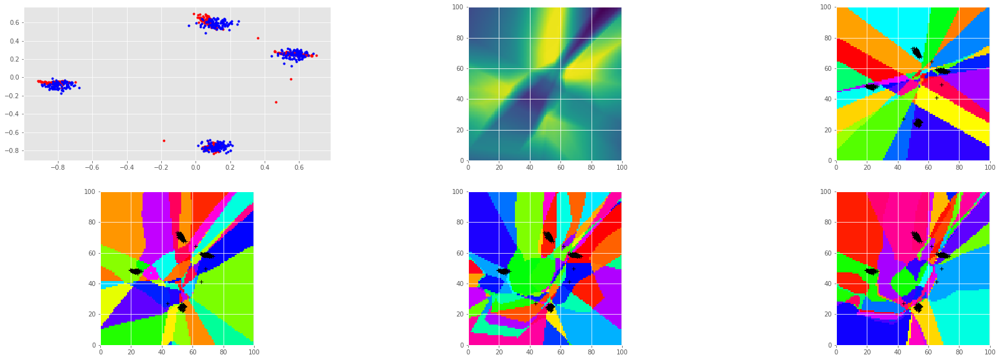

1.42828392982 0.0105805806816 0.00318565452471 0.0257493667305 0.00963359232992
[array(0.6852987, dtype=float32)]


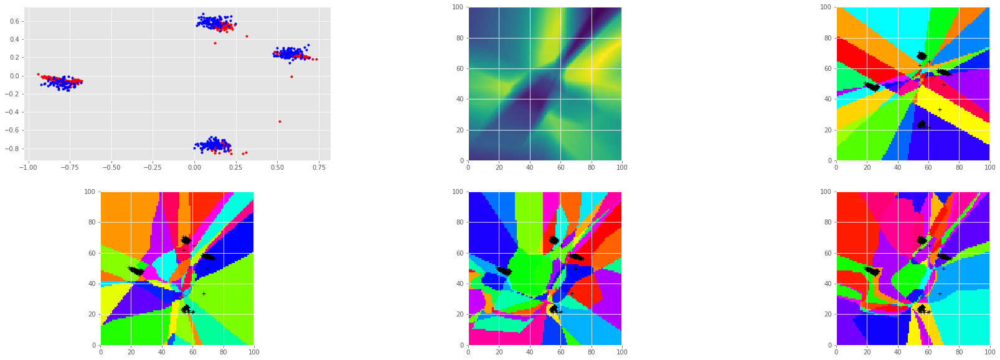

1.41922569275 0.010680237785 0.00318398233503 0.0105381458998 0.00844344124198
[array(0.6945251, dtype=float32)]


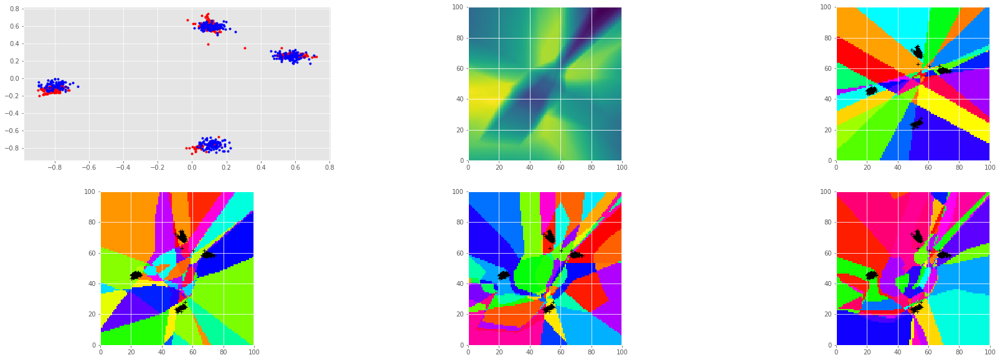

1.45331060886 0.011192984879 0.00327844358981 0.0413593128324 0.0157990343869
[array(0.6959622, dtype=float32)]


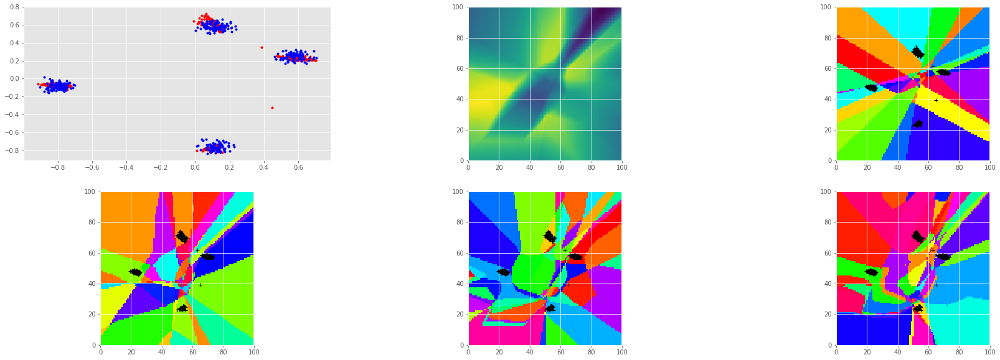

1.41848552227 0.0103225782514 0.00425383076072 0.00865787267685 0.0090393377468
[array(0.69056225, dtype=float32)]


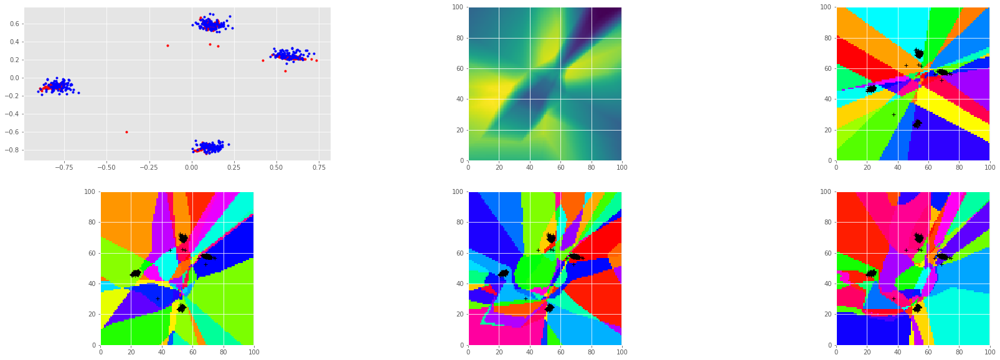

1.44996833801 0.012766671367 0.00289850775152 0.0372177064419 0.0145246414468
[array(0.7131252, dtype=float32)]


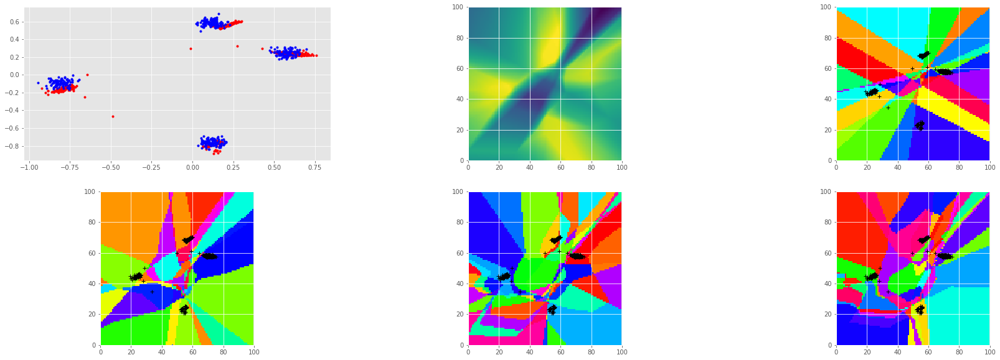

1.44327628613 0.00935361348093 0.00324850063771 0.00665496056899 0.033675417304
[array(0.6988705, dtype=float32)]


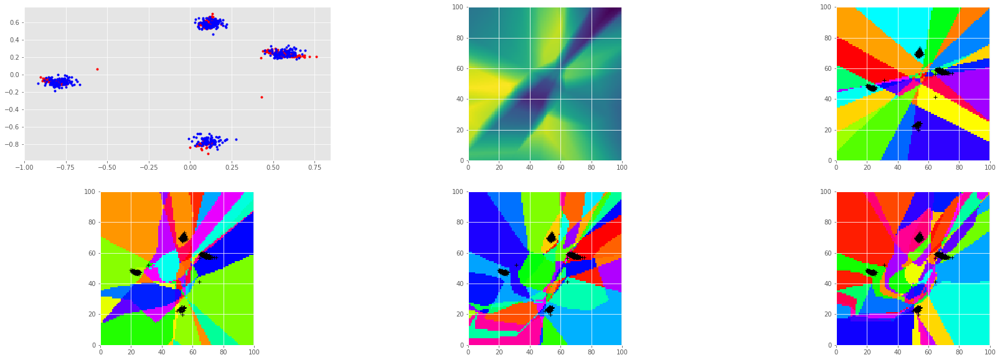

1.4287519455 0.0105790188536 0.0029984281864 0.018015993759 0.021160941571
[array(0.6998236, dtype=float32)]


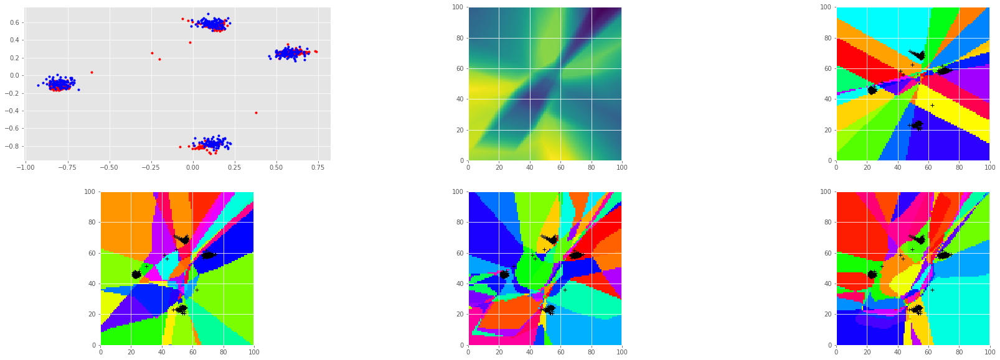

1.44305348396 0.0110219288617 0.00275571318343 0.0134679479524 0.0208518020809
[array(0.71028626, dtype=float32)]


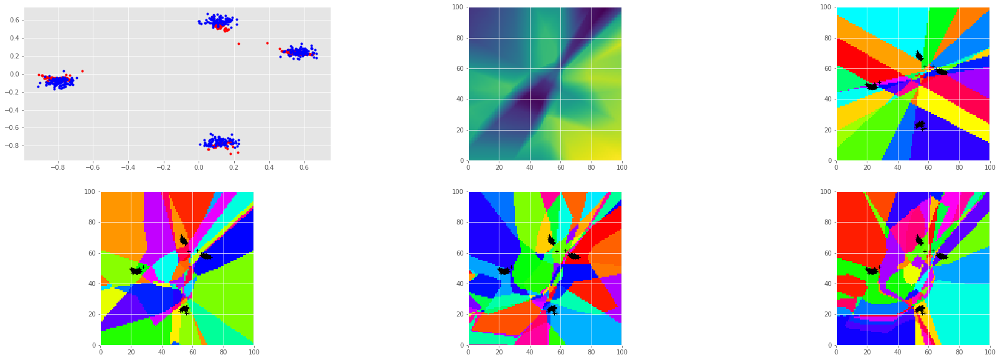

1.50019943714 0.00869789347053 0.00229969923384 0.0818254798651 0.0151048842818
[array(0.69658184, dtype=float32)]


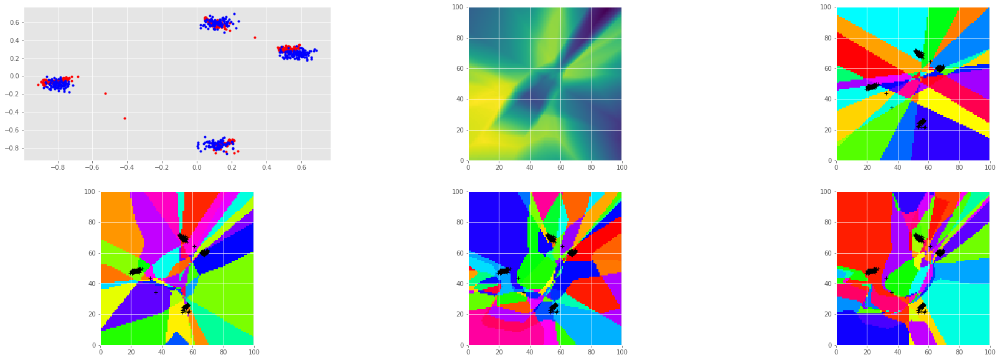

1.41431343555 0.00988459587097 0.00344588374719 0.0190399866551 0.00609942898154
[array(0.7028217, dtype=float32)]


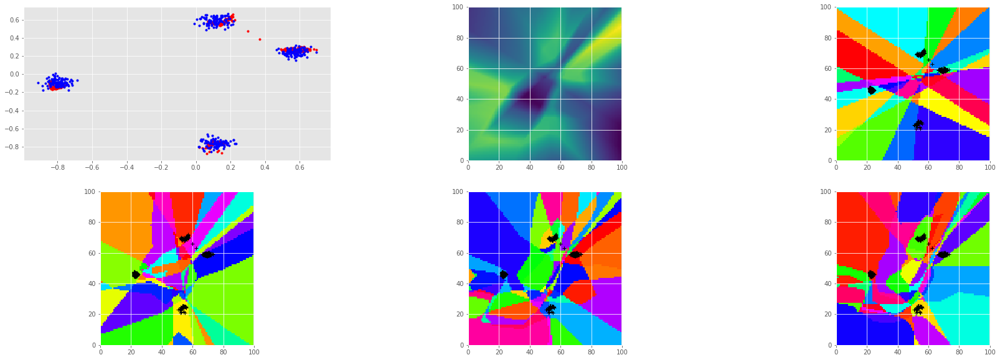

1.41529536247 0.0107030626386 0.00329808471724 0.00535335345194 0.0118606965989
[array(0.7012638, dtype=float32)]


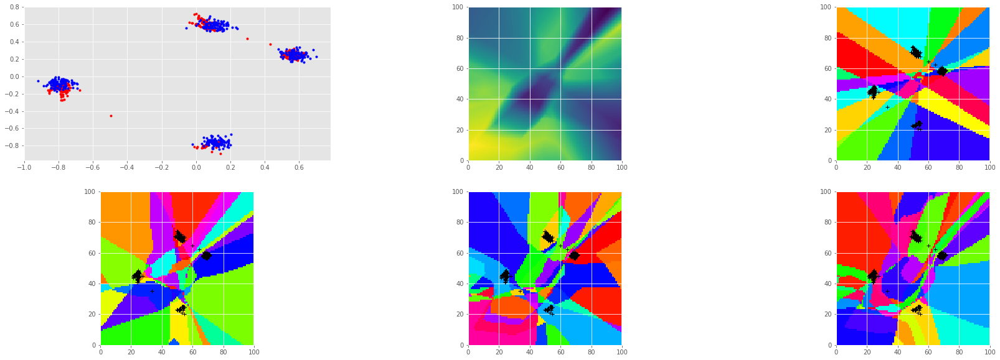

1.43705654144 0.0103467777371 0.00293373479508 0.0278315600008 0.00811252370477
[array(0.6936046, dtype=float32)]


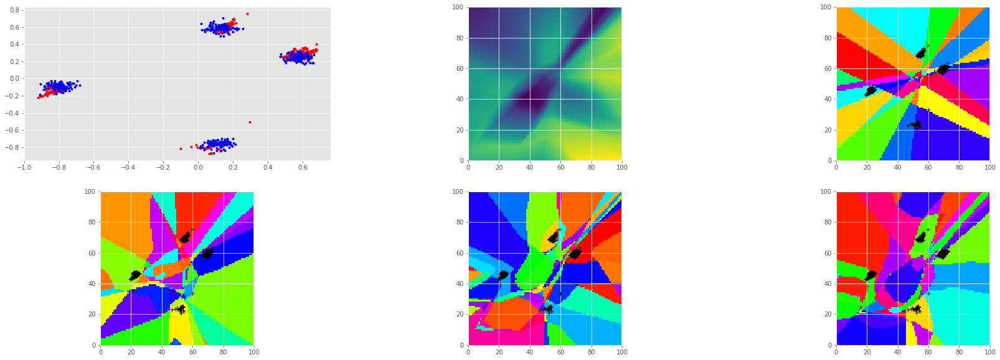

1.44346177578 0.0108220456168 0.00348053220659 0.0262089446187 0.0178272910416
[array(0.6891995, dtype=float32)]


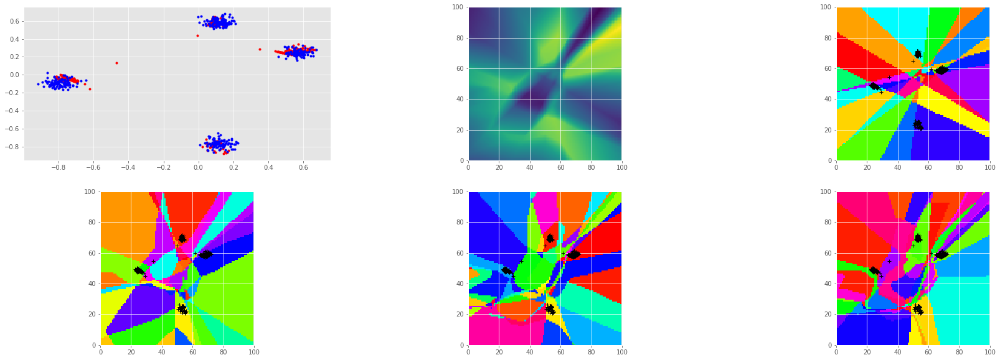

1.49071371555 0.00915367621928 0.00368846603669 0.00920283049345 0.0844602286816
[array(0.7068213, dtype=float32)]


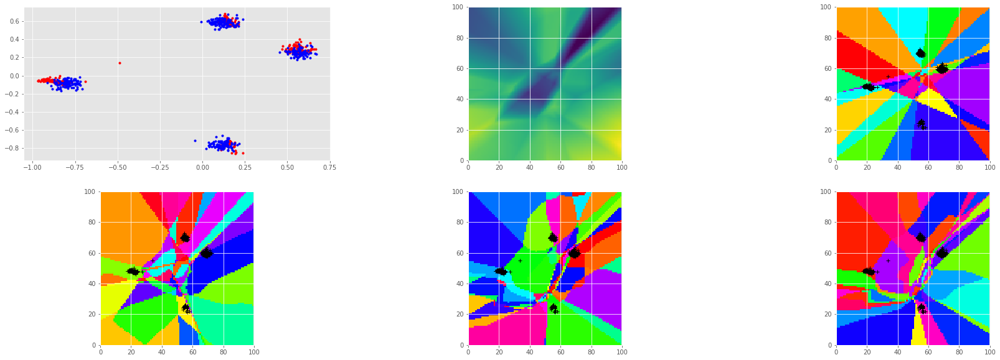

1.42977511883 0.009417434223 0.00408696010709 0.0150720681995 0.0153688825667
[array(0.69488084, dtype=float32)]


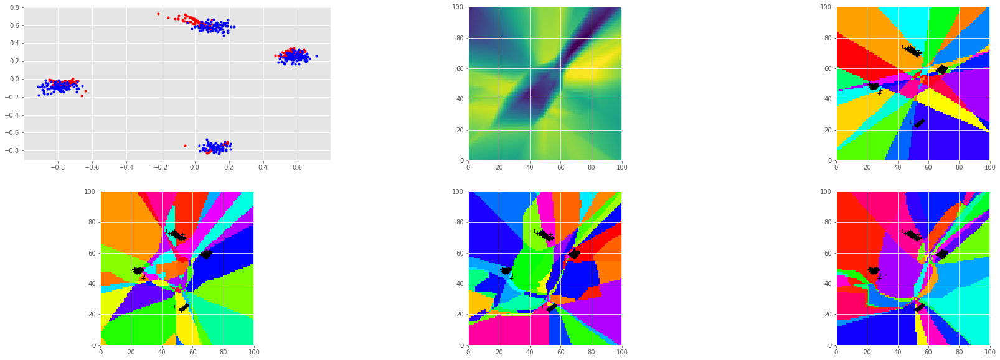

1.44019150734 0.0100172199309 0.00282995868474 0.0081511773169 0.0330265238881
[array(0.6986134, dtype=float32)]


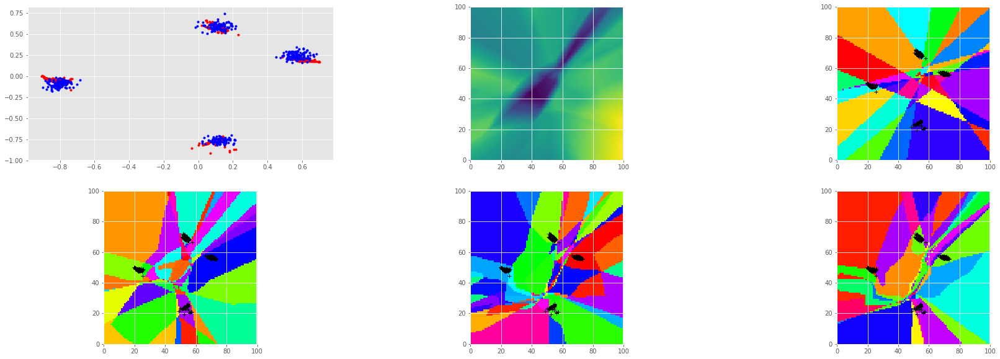

1.41654348373 0.0103960949928 0.00418234569952 0.00632467679679 0.00744030997157
[array(0.6985891, dtype=float32)]


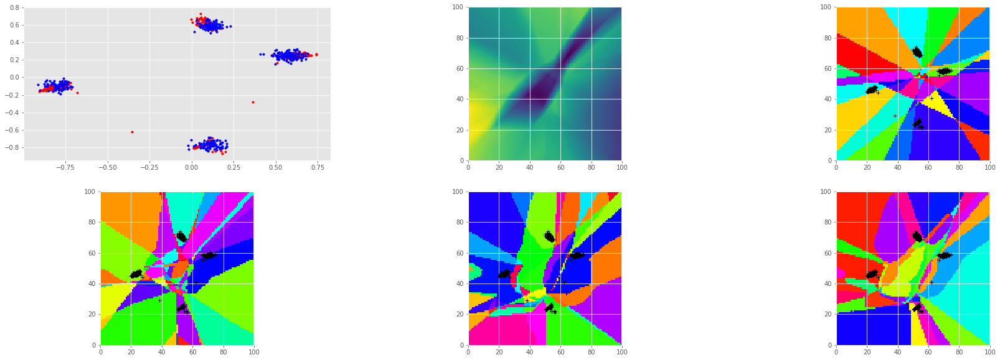

1.41972243786 0.0103943031281 0.0036546420306 0.0165774840862 0.00665836175904
[array(0.69943017, dtype=float32)]


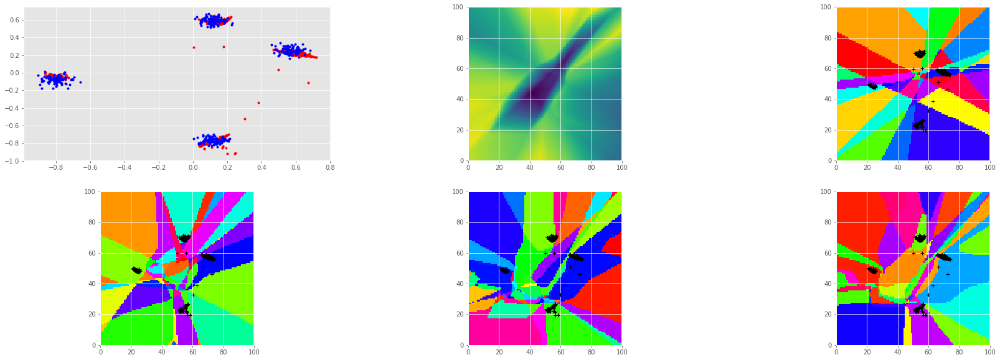

1.4093350172 0.00933979265392 0.00367349013686 0.00537289585918 0.00613600295037
[array(0.6999531, dtype=float32)]


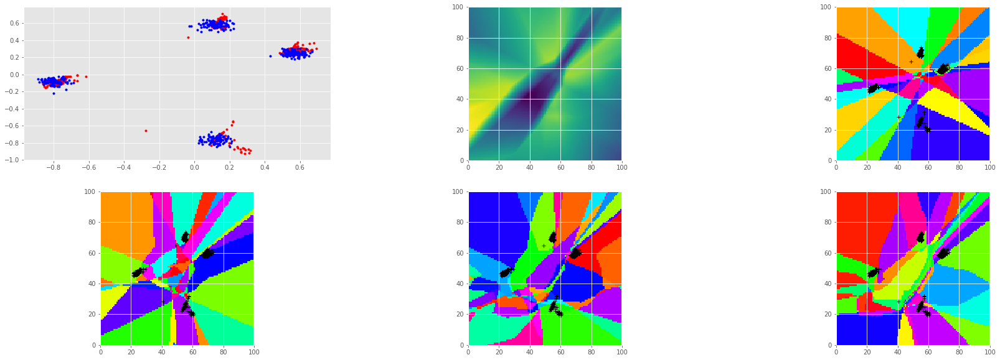

1.400826931 0.00924008339643 0.003459981177 0.00544729270041 0.00372500345111
[array(0.6931959, dtype=float32)]


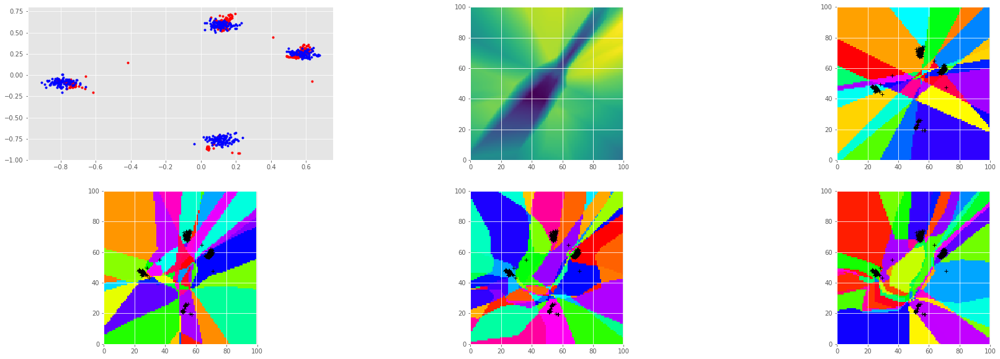

1.41657102108 0.00933745317161 0.00292539782822 0.0114891929552 0.0134796407074
[array(0.6903835, dtype=float32)]


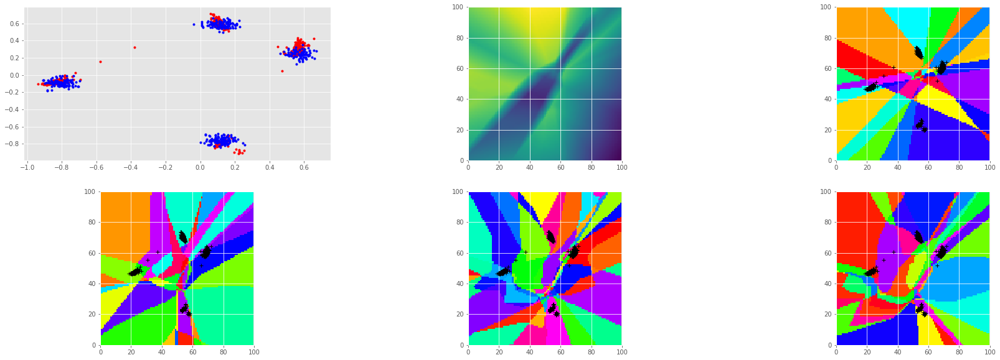

1.44414246082 0.0104636643082 0.00368362804875 0.0404053404927 0.00893369410187
[array(0.6903615, dtype=float32)]


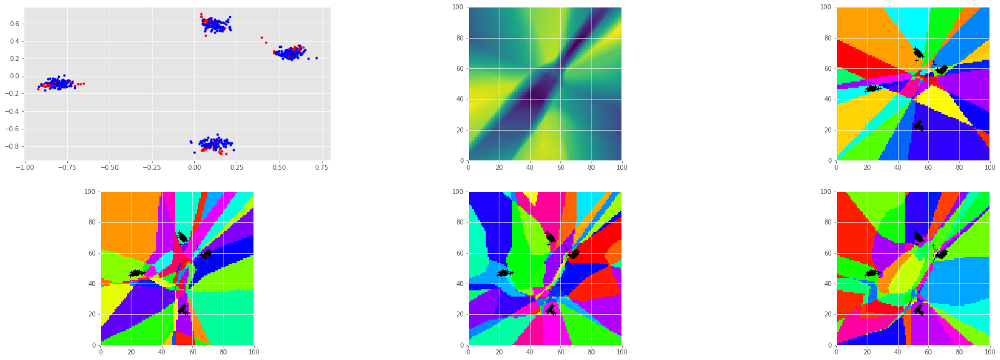

1.42394506931 0.010382104665 0.00412406679243 0.016176071018 0.0130599178374
[array(0.7049029, dtype=float32)]


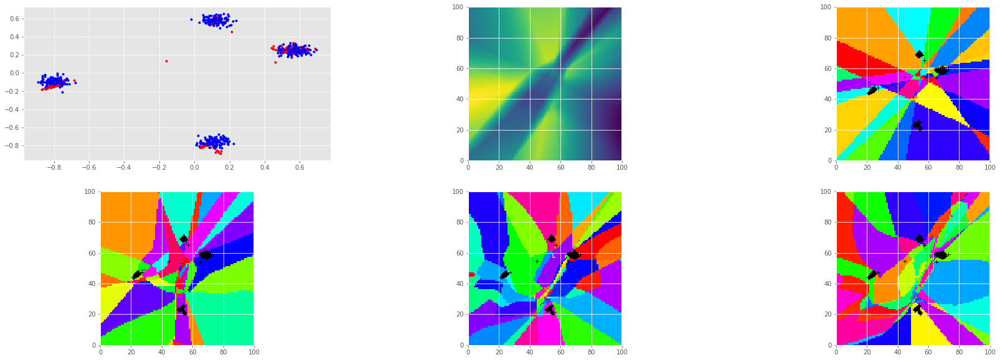

1.43067765236 0.0104262661189 0.0048753451556 0.00969993695617 0.0238125659525
[array(0.69503784, dtype=float32)]


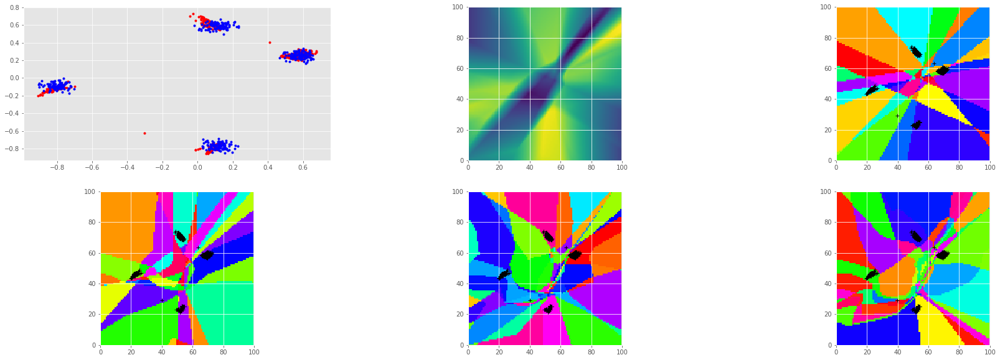

1.49718093872 0.0109544266015 0.0037696112413 0.0157061815262 0.0770130753517
[array(0.6944022, dtype=float32)]


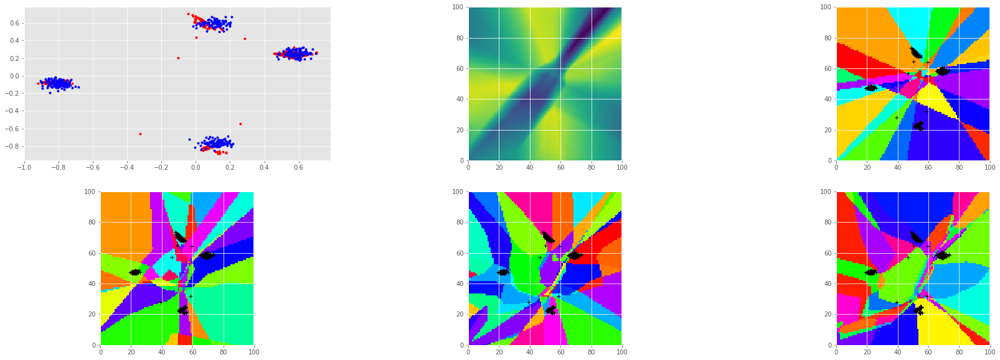

1.45918250084 0.00934101827443 0.00362441013567 0.0321112982929 0.0338320173323
[array(0.6805424, dtype=float32)]


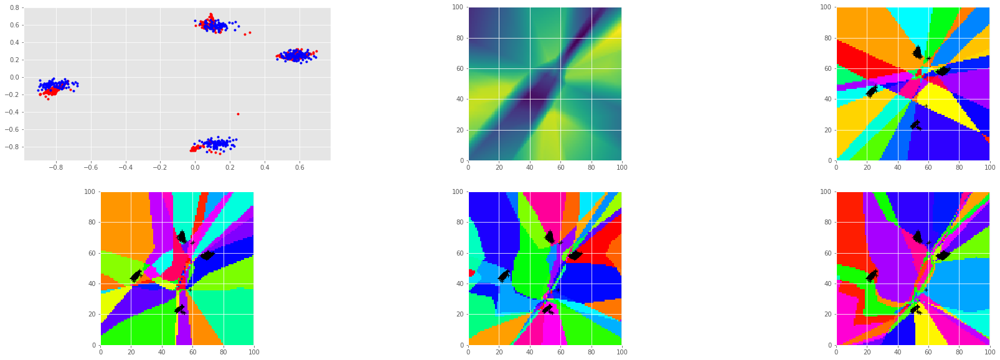

1.41138160229 0.0102008823305 0.0041770003736 0.00362342735752 0.0100611690432
[array(0.69365215, dtype=float32)]


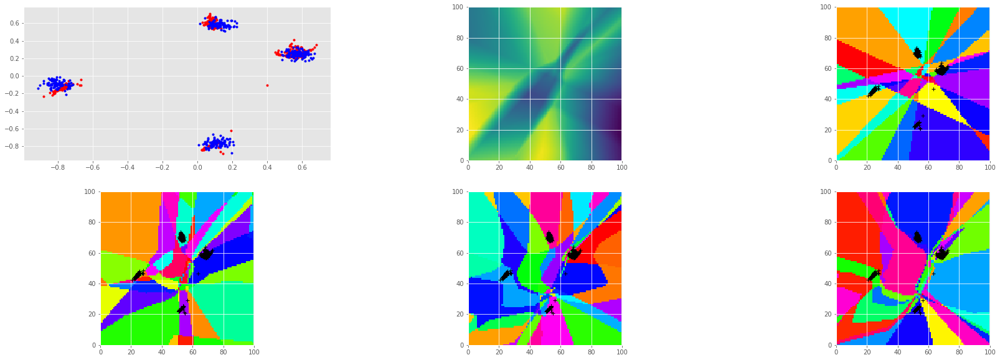

1.41367185116 0.00922705791891 0.00328197795898 0.00350807304494 0.0102743189782
[array(0.69382995, dtype=float32)]


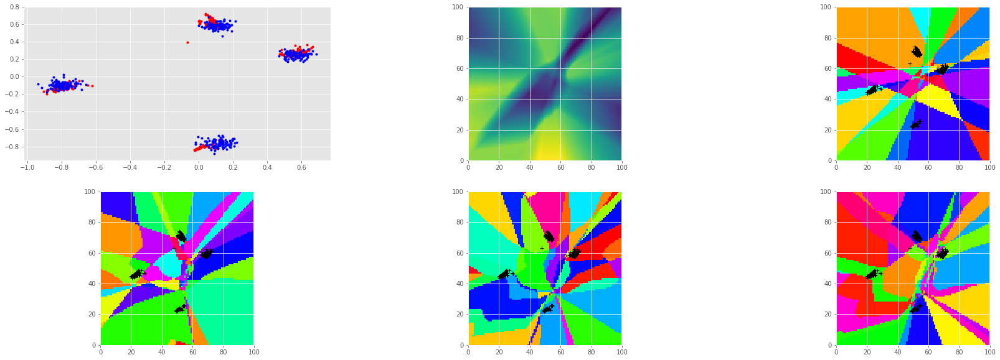

1.47050857544 0.0104439854622 0.00385706173256 0.0476354770362 0.0249342545867
[array(0.69791746, dtype=float32)]


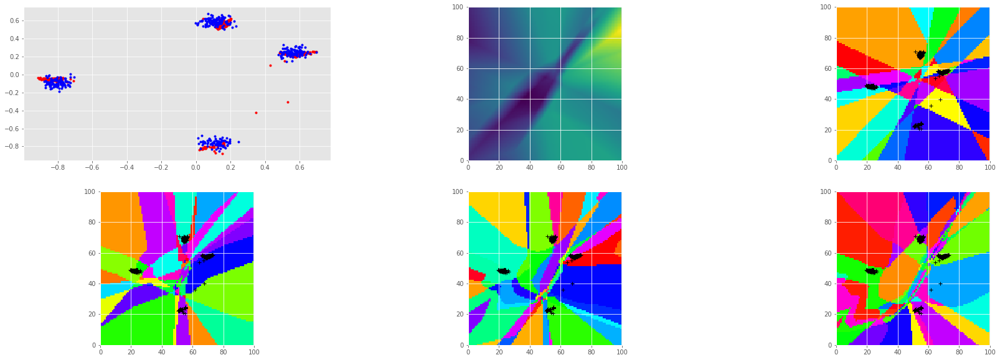

1.45614922047 0.00852774642408 0.00346732418984 0.0159456171095 0.0336773023009
[array(0.693959, dtype=float32)]


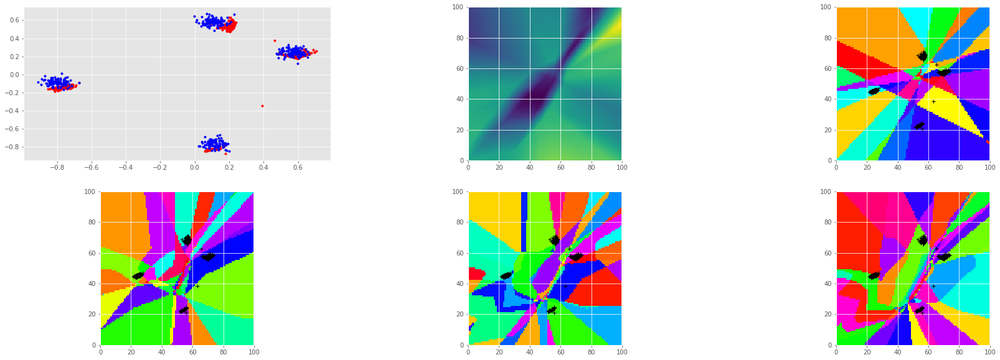

1.45313465595 0.010848607868 0.00342963729054 0.0321006216109 0.0199221745133
[array(0.6927585, dtype=float32)]


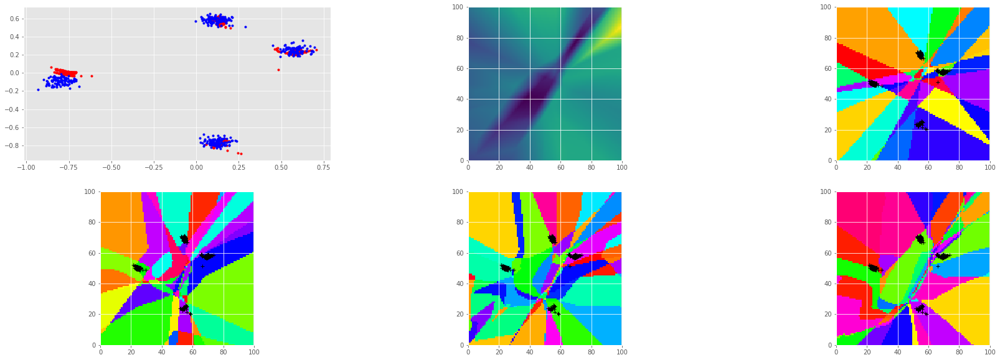

1.40605676174 0.0103698726743 0.00287811970338 0.00396197941154 0.00427959579974
[array(0.6972572, dtype=float32)]


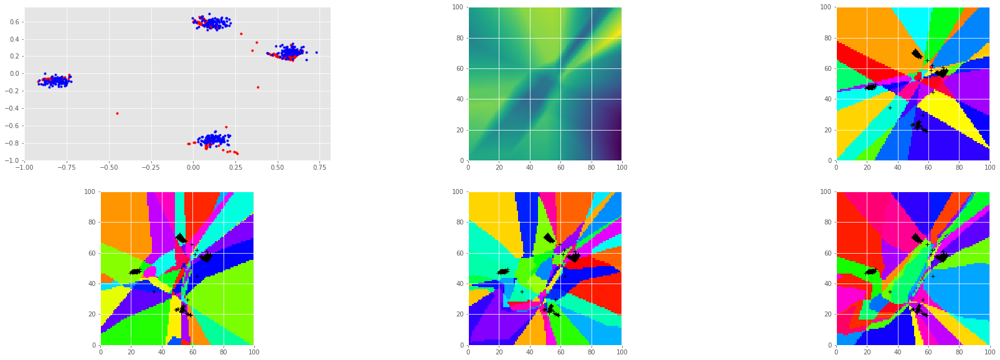

1.43064975739 0.0101430471987 0.00346856936812 0.00526938773692 0.0225103907287
[array(0.6908472, dtype=float32)]


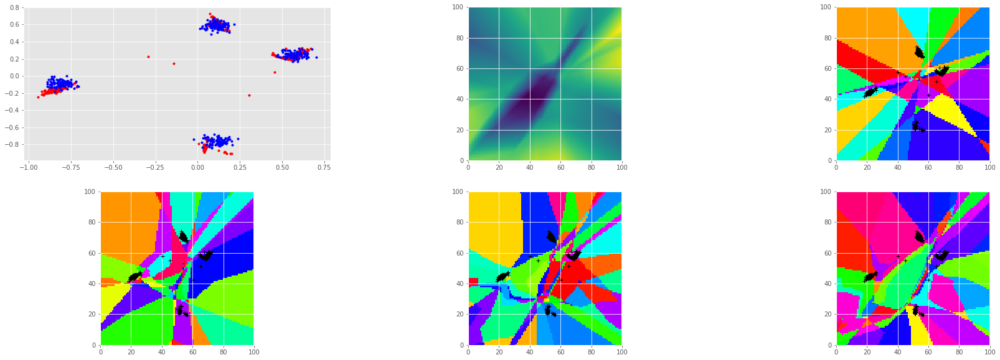

1.41736757755 0.00992037169635 0.00274704233743 0.02387384139 0.00295773334801
[array(0.6983053, dtype=float32)]


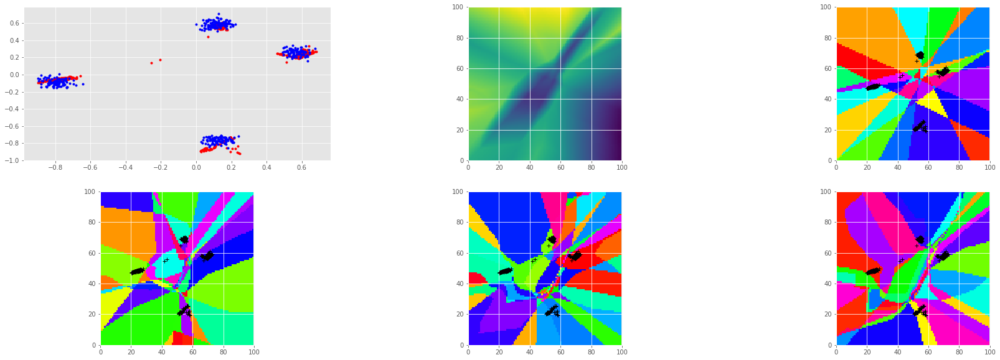

1.45714199543 0.0106865596026 0.00343862595037 0.0437624454498 0.0108118830249
[array(0.6946417, dtype=float32)]


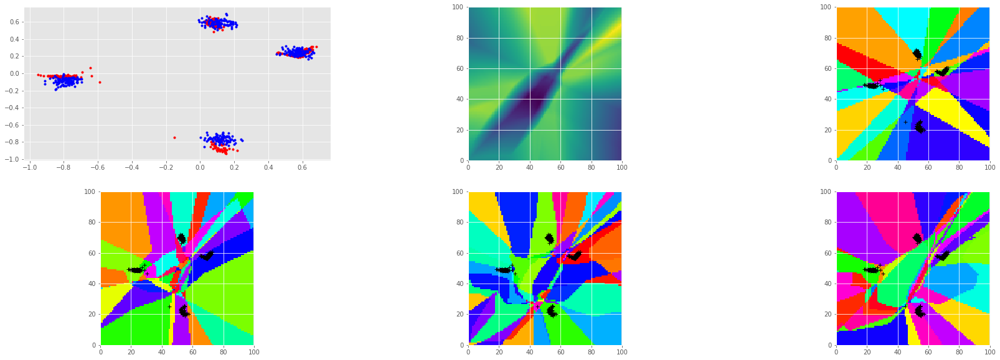

1.41137576103 0.010640218854 0.00336487591267 0.00180784612894 0.0105289425701
[array(0.6914046, dtype=float32)]


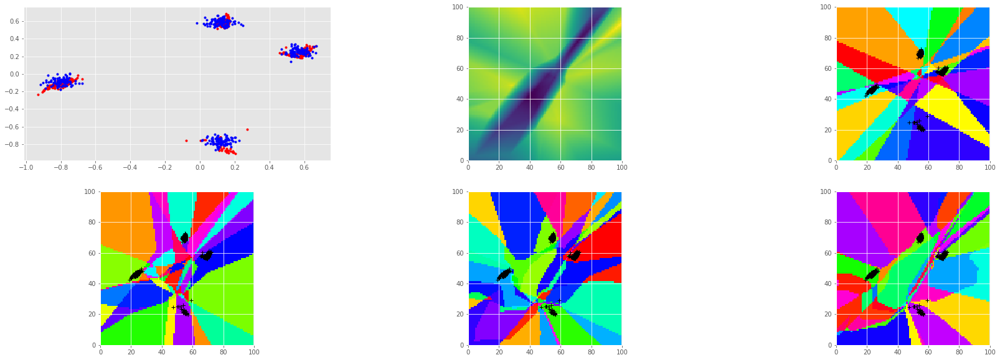

1.4275124073 0.00804700888693 0.00342389731668 0.0181787796319 0.0131022706628
[array(0.6968199, dtype=float32)]


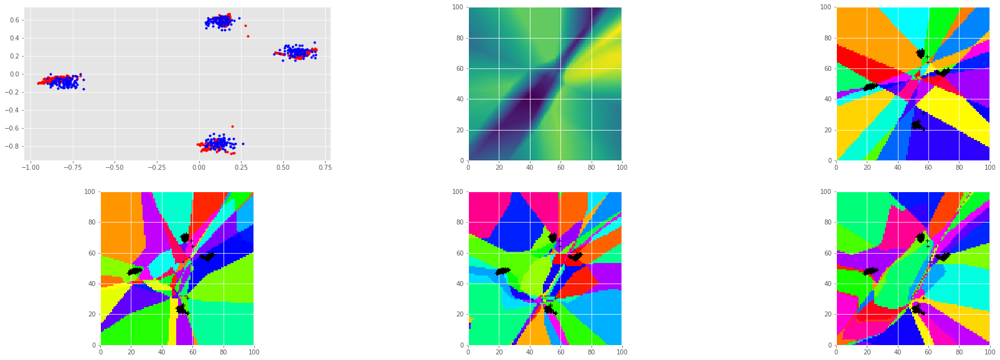

1.42707765102 0.00878607109189 0.00298397778533 0.00484836567193 0.0206739827991
[array(0.6885954, dtype=float32)]


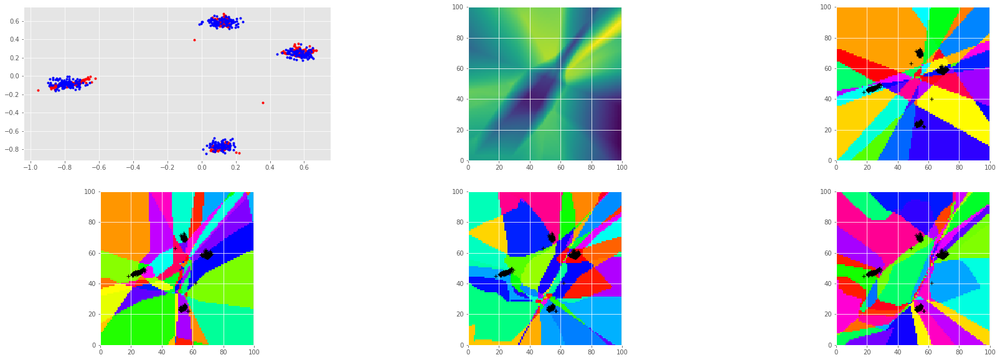

1.4491686821 0.00964359659702 0.0034444918856 0.0170397758484 0.0322433821857
[array(0.6953479, dtype=float32)]


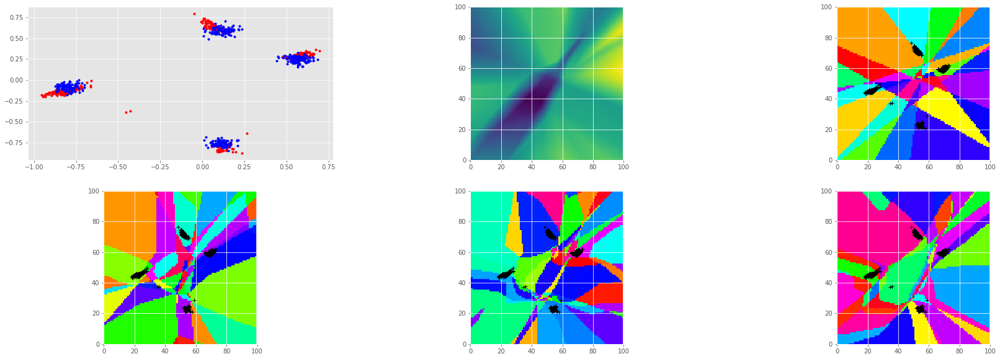

In [21]:
data_itr = batch(X[np.random.choice(len(X),len(X),False)], batch_size)

for k in range(100000):
    
    for _ in range(3):
        try:
            real_data_batch = next(data_itr)
        except StopIteration:
            np.random.shuffle(X)
            X = np.ascontiguousarray(X)
            data_itr = batch(X, batch_size)
            real_data_batch = next(data_itr)

        d_cost_values = d_train_func(real_data_batch.astype(np.float32))
    
    g_cost_values = g_train_func()
    
    if k % 1000 == 0:
        for d in d_cost_values:
            print d.item(),
        print
        print g_cost_values
        
        sampled_x = np.concatenate([g_sample_func() for _ in range(10)])
        m_vals = d_monitor_func(grid_data.astype(np.float32))
        
        plt.clf()
        plt.figure(figsize=(30,10))
        
        plt.subplot(231)
        plt.plot(sampled_x[:,0], sampled_x[:,1], 'r.')
        plt.plot(X[::100, 0], X[::100, 1], 'b.')
        
        #plt.gcf().savefig(os.path.join(out_dir,".png"), bbox_inches='tight')
        #plt.show()
        
        plt.subplot(232)
        plt.imshow(m_vals[0].reshape((100,100)))
        plt.xlim([0,100])
        plt.ylim([0,100])
        
        plt.subplot(233)
        cc = val2c(m_vals[1])
        plt.imshow(convert_color(cc,1024).reshape((100,100,3)))
        plt.plot(rescale(sampled_x[:,0], -lim, lim)*100, rescale(sampled_x[:,1], -lim, lim)*100, 'k+')
        plt.xlim([0,100])
        plt.ylim([0,100])
        
        plt.subplot(234)
        cc = val2c(m_vals[2])
        plt.imshow(convert_color(cc,1024).reshape((100,100,3)))
        plt.plot(rescale(sampled_x[:,0], -lim, lim)*100, rescale(sampled_x[:,1], -lim, lim)*100, 'k+')
        plt.xlim([0,100])
        plt.ylim([0,100])
        
        plt.subplot(235)
        cc = val2c(m_vals[3])
        plt.imshow(convert_color(cc,1024).reshape((100,100,3)))
        plt.plot(rescale(sampled_x[:,0], -lim, lim)*100, rescale(sampled_x[:,1], -lim, lim)*100, 'k+')
        plt.xlim([0,100])
        plt.ylim([0,100])
        
        plt.subplot(236)
        cc = val2c(m_vals[4])
        plt.imshow(convert_color(cc,1024).reshape((100,100,3)))
        plt.plot(rescale(sampled_x[:,0], -lim, lim)*100, rescale(sampled_x[:,1], -lim, lim)*100, 'k+')
        plt.xlim([0,100])
        plt.ylim([0,100])
        
#       plt.subplot(236)
#       cc = val2c(m_vals[5])
#       imshow(convert_color(cc,1024).reshape((100,100,3)))
#       plt.plot(rescale(sampled_x[:,0], -5, 5)*100, rescale(sampled_x[:,1], -5, 5)*100, 'k+')
        plt.show()
